# Recommended Workflow before Running this Notebook

1. Download uncalibrated images from MAST
2. Run the JWST pipelines: {filter}_cal.ipynb
3. Using the padded images from the calibration step, run Winne to get HPFRDI and deconvolved images: {filter}_deconv.ipynb
4. Save the HPFRDI and deconvolved images as fits files: F187N.fits, F200W.fits, F356W.fits, F444W.fits

# F200W


### HPFRDI Image

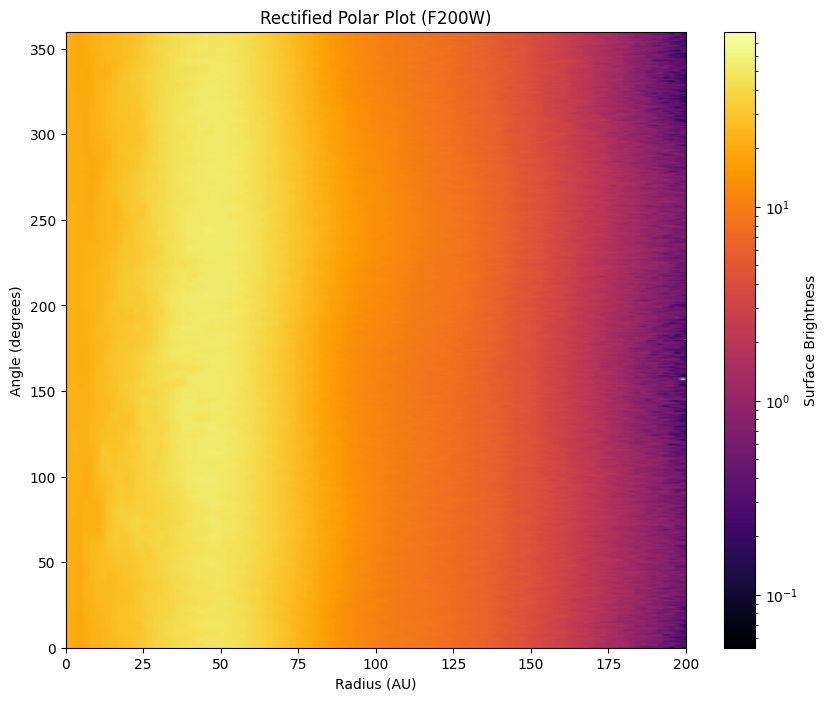

In [7]:
# Rectified Polar Plot
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from matplotlib.colors import LogNorm
from scipy.ndimage import map_coordinates

# Load the FITS file
fits_file = 'source/F200W.fits'
hdul = fits.open(fits_file)
data = hdul[0].data
image = data[:,:,1]

# Read header
header = hdul[0].header
# print(header) # You can uncomment this to see the header details
pixel_scale = header['PIXSCALE'] # in arcsec/pixel
dist = 60.14 # distance to TW Hya in pc

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(image, 99.975)

# --- Polar transform ---

# Image dimensions and center
ny, nx = image.shape
center_y, center_x = (ny - 1) / 2.0, (nx - 1) / 2.0

# Define the polar grid
# The radius is the distance from the center to the corner.
max_radius_pix = np.sqrt(center_y**2 + center_x**2)
nr = int(max_radius_pix)
ntheta = 720 # number of angular points

radii_pix = np.linspace(0, max_radius_pix, nr)
thetas = np.linspace(0, 2 * np.pi, ntheta)

# Create a grid of polar coordinates
r_grid, theta_grid = np.meshgrid(radii_pix, thetas)

# Convert polar to Cartesian coordinates
x_cart = r_grid * np.cos(theta_grid + np.pi/2) + center_x
y_cart = r_grid * np.sin(theta_grid + np.pi/2) + center_y

# The coordinates for map_coordinates should be in a (2, N) array
coords = np.array([y_cart.ravel(), x_cart.ravel()])

# Perform the transformation
polar_image = map_coordinates(image, coords, order=1, mode='constant', cval=np.nan).reshape((ntheta, nr))

# plot the image
plt.figure(figsize=(10, 8), dpi=100)
plt.imshow(polar_image, origin='lower', cmap='inferno', 
           norm=LogNorm(vmin=clim_low_raw, vmax=clim_high_raw),
           aspect='auto', extent=[0, max_radius_pix*pixel_scale*dist, 0, 360])

# Set x limit to 0 to 200 AU
plt.xlim(0, 200)
plt.colorbar(label='Surface Brightness')
filter_name = fits_file.split('/')[-1].split('.')[0]
plt.title(f'Rectified Polar Plot ({filter_name})')
plt.ylabel('Angle (degrees)')
plt.xlabel('Radius (AU)')
plt.savefig('rectified_polar.png')
plt.show()

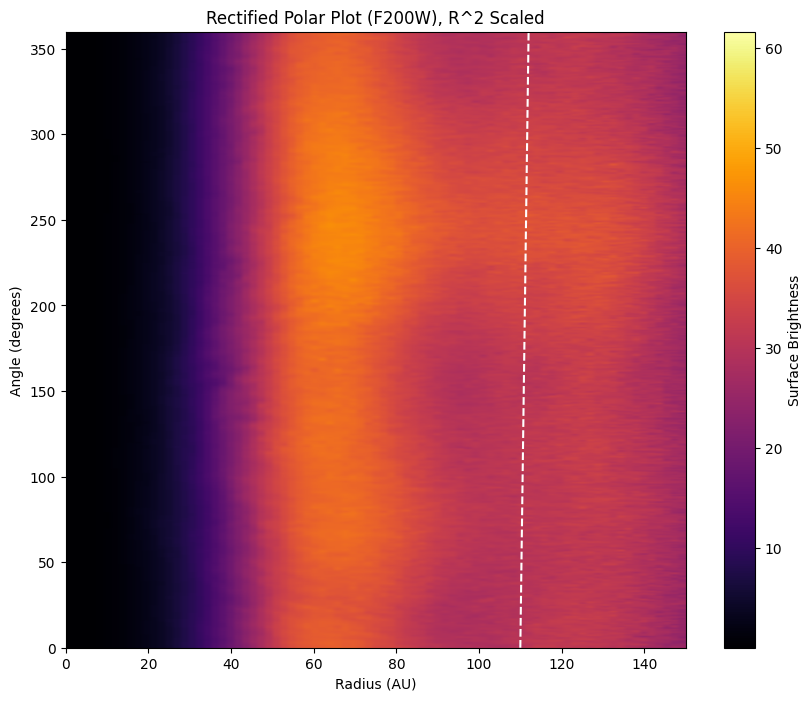

In [8]:
# Apply R^2 scaling to enhance outer features
radii_arcsec = radii_pix * pixel_scale
polar_image_r2_scaled = np.zeros_like(polar_image)
for i in range(polar_image.shape[1]):
    if radii_arcsec[i] > 0:
        polar_image_r2_scaled[:, i] = polar_image[:, i] * (radii_arcsec[i]**2)

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(polar_image_r2_scaled, 97)

# plot the image
plt.figure(figsize=(10, 8), dpi=100)
plt.imshow(polar_image_r2_scaled, origin='lower', cmap='inferno', 
           vmin=clim_low_raw, vmax=clim_high_raw,
           aspect='auto', extent=[0, max_radius_pix*pixel_scale*dist, 0, 360])

# add a sloped line at 110 AU with slope 2 degrees to the vertical axis
x = np.array([110, 112])
y = np.array([0, 360])
plt.plot(x, y, color='white', linestyle='--', label='Slope = 2 degrees')

# Set x limit to 0 to 200 AU
plt.xlim(0, 150)
plt.colorbar(label='Surface Brightness')
filter_name = fits_file.split('/')[-1].split('.')[0]
plt.title(f'Rectified Polar Plot ({filter_name}), R^2 Scaled')
plt.ylabel('Angle (degrees)')
plt.xlabel('Radius (AU)')
plt.savefig('rectified_polar.png')
plt.show()

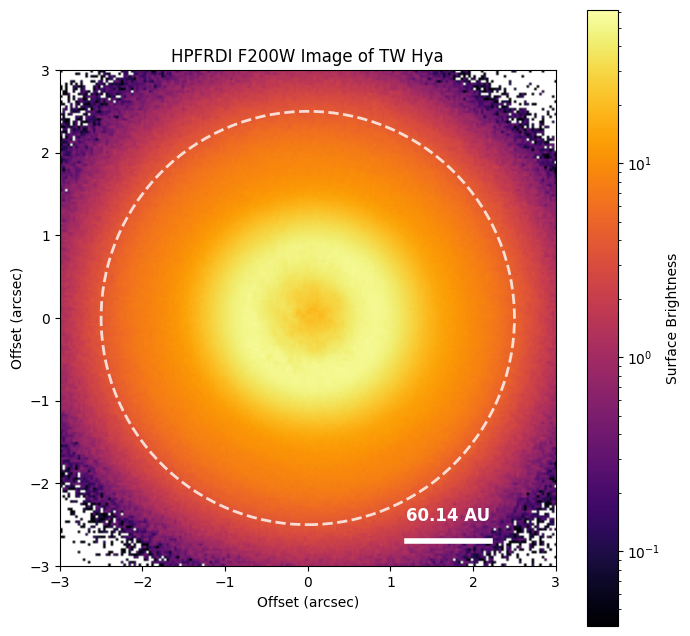

In [9]:
# --- Plot Original Image ---
plt.figure(figsize=(8, 8), dpi=100)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [-half_extent, half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = extent_arcsec / pixel_scale
half_extent_pix = extent_pixels / 2

# Create a cropped view centered on the image
x_start = int(center_x - half_extent_pix)
x_end = int(center_x + half_extent_pix)
y_start = int(center_y - half_extent_pix)
y_end = int(center_y + half_extent_pix)

# Ensure we don't go outside image bounds
x_start = max(0, x_start)
x_end = min(nx, x_end)
y_start = max(0, y_start)
y_end = min(ny, y_end)

cropped_image = image[y_start:y_end, x_start:x_end]

plt.imshow(cropped_image, origin='lower', cmap='inferno', 
           norm=LogNorm(vmin=clim_low_raw, vmax=clim_high_raw),
           extent=extent)

# Add reference circle at 5" radius (actually 2.5" radius since extent goes from -2.5 to +2.5)
circle = plt.Circle((0, 0), 2.5, fill=False, color='white', linewidth=2, linestyle='--', alpha=0.8)
plt.gca().add_patch(circle)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

plt.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
plt.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# Convert extent to AU for secondary labels
extent_au = np.array(extent) * dist  # Convert arcsec to AU

plt.colorbar(label='Surface Brightness')
plt.title(f'HPFRDI {filter_name} Image of TW Hya')

# Set primary axes labels in arcseconds
plt.xlabel('Offset (arcsec)')
plt.ylabel('Offset (arcsec)')

plt.savefig('original_image.png', dpi=300, bbox_inches='tight')
plt.show()


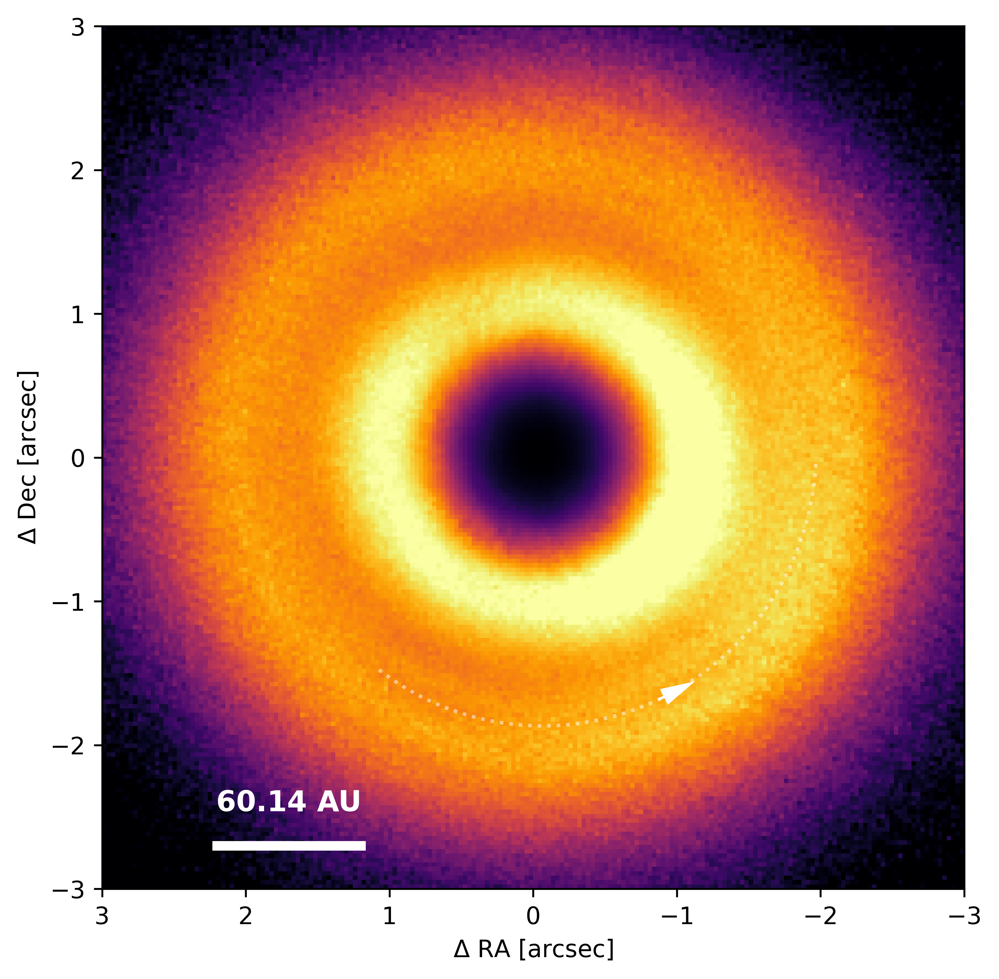

In [10]:
# --- Plot Original Image ---
plt.figure(figsize=(6.5, 6.5), dpi=600)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [half_extent, -half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = extent_arcsec / pixel_scale
half_extent_pix = extent_pixels / 2

# Create a cropped view centered on the image
x_start = int(center_x - half_extent_pix)
x_end = int(center_x + half_extent_pix)
y_start = int(center_y - half_extent_pix)
y_end = int(center_y + half_extent_pix)

# Ensure we don't go outside image bounds
x_start = max(0, x_start)
x_end = min(nx, x_end)
y_start = max(0, y_start)
y_end = min(ny, y_end)

cropped_image = image[y_start:y_end, x_start:x_end]

# distance of each pixel in arcseconds
distances = np.empty_like(cropped_image)
for i in range(cropped_image.shape[0]):
    for j in range(cropped_image.shape[1]):
        # Calculate distance from the center in arcseconds
        distances[i, j] = np.sqrt(((y_start + i) - center_y)**2 + ((x_start + j) - center_x)**2) * pixel_scale

# Normalize the image by maximum value and scale by distance^2
scaled_image = cropped_image * distances**2
normalized_image = scaled_image / np.nanpercentile(scaled_image, 97)
plt.imshow(normalized_image, origin='lower', cmap='inferno',
           vmax=1.0, vmin=0.0,
           extent=extent)

# Add reference circle at 5" radius (actually 2.5" radius since extent goes from -2.5 to +2.5)
#circle = plt.Circle((0, 0), 2.5, fill=False, color='white', linewidth=2, linestyle='--', alpha=0.8)
#plt.gca().add_patch(circle)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

plt.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
plt.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# Add log spiral with a slope of 2 degrees
theta = np.linspace(-0.7 * np.pi, 0, 100)
r_spiral = 1.97* np.exp(np.tan(np.radians(2)) * theta)
x_spiral = r_spiral * np.cos(theta)
y_spiral = r_spiral * np.sin(theta)
plt.plot(-x_spiral, y_spiral, color='white', linestyle=':', label='Log Spiral', alpha=0.5)

# Add a arrow indicating the log spiral direction
plt.arrow( -r_spiral[50]*np.cos(theta[50]), r_spiral[50]*np.sin(theta[50]),
           -0.5*(r_spiral[51]-r_spiral[50])*np.cos(theta[50])-r_spiral[50]*(-np.sin(theta[50])*(theta[51]-theta[50])),
           0.5*(r_spiral[51]-r_spiral[50])*np.sin(theta[50])+r_spiral[50]*(np.cos(theta[50])*(theta[51]-theta[50])),
           head_width=0.1, head_length=0.2, fc='white', ec='white')
           
# Add vertical (to the spiral) lines at the start and end of the spiral
'''
plt.plot([r_spiral[0]*np.cos(theta[0]) - 0.1/2**0.5, r_spiral[0]*np.cos(theta[0]) + 0.1/2**0.5],
         [r_spiral[0]*np.sin(theta[0]) - 0.1/2**0.5, r_spiral[0]*np.sin(theta[0]) + 0.1/2**0.5],
         color='white', linestyle='-', alpha=1)
plt.plot([r_spiral[-1]*np.cos(theta[-1]) + 0.1, r_spiral[-1]*np.cos(theta[-1]) - 0.1],
         [r_spiral[-1]*np.sin(theta[-1]), r_spiral[-1]*np.sin(theta[-1])],
         color='white', linestyle='-')
'''
# Convert extent to AU for secondary labels
extent_au = np.array(extent) * dist  # Convert arcsec to AU

#plt.colorbar(label=r'Normalized Surface Brightness scaled by $distance^2$')
#plt.title(f'Deconvolved {filter_name} Image of TW Hya')

# Set primary axes labels in arcseconds
plt.xlabel(r'$\Delta$ RA [arcsec]')
plt.ylabel(r'$\Delta$ Dec [arcsec]')

plt.savefig('original_image.png', dpi=600, bbox_inches='tight')
plt.show()

total pixels in annulus: 384
Radius 39 au: Max at 194.3 deg, Min at 22.1 deg (Bin Width: 42.19 deg, Resolution: 0.94 deg)
total pixels in annulus: 544
Radius 53 au: Max at 226.4 deg, Min at 40.9 deg (Bin Width: 29.78 deg, Resolution: 0.66 deg)
total pixels in annulus: 896
Radius 88 au: Max at 245.9 deg, Min at 13.9 deg (Bin Width: 18.08 deg, Resolution: 0.40 deg)
total pixels in annulus: 1480
Radius 141 au: Max at 242.6 deg, Min at 359.6 deg (Bin Width: 10.95 deg, Resolution: 0.24 deg)


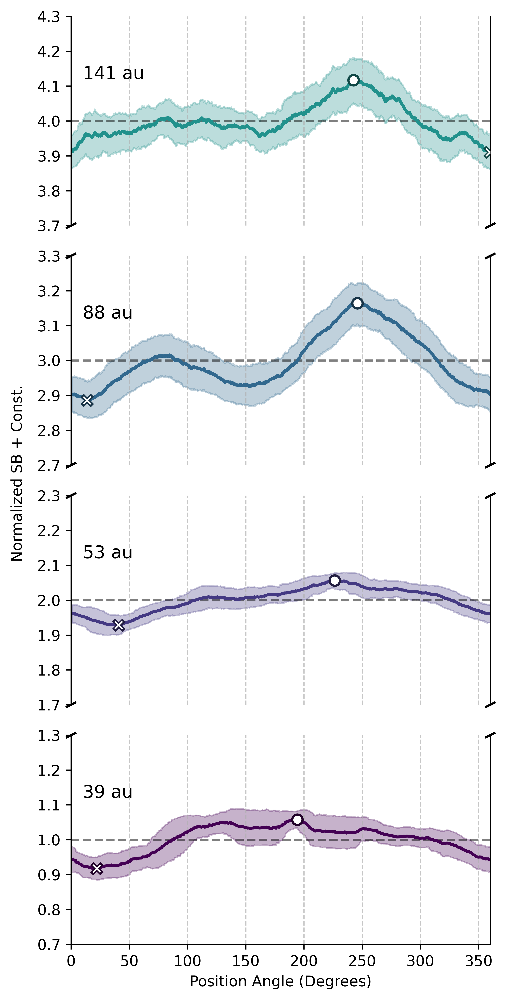

In [46]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from numpy.lib.stride_tricks import sliding_window_view

# Load the FITS file
fits_file = 'source/F200W.fits'
hdul = fits.open(fits_file)
data = hdul[0].data
image = data[:, :, 1]

# Read header
header = hdul[0].header
pixel_scale = header['PIXSCALE'] 
dist = 60.14 

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(image, 99.975)

# --- Configurations & Inputs ---
y_ranges = [(0.7, 1.3), (1.7, 2.3), (2.7, 3.3), (3.7, 4.3)]
radii_au = np.array([39, 53, 88, 141])

r_bin_size_pix = 3
theta_bin_size_pix = 15
beam_size_pix = 46.528953706984169 # beam size in pixels used for error calculation

# --- Cartesian Coordinate Grid Setup ---

# Image dimensions and center
ny, nx = image.shape
center_y, center_x = (ny - 1) / 2.0, (nx - 1) / 2.0

# Generate 2D grids of pixel indices
y_indices, x_indices = np.indices(image.shape)
dy = y_indices - center_y
dx = x_indices - center_x

# Calculate the physical radius (in pixels) for every pixel
r_grid = np.sqrt(dx**2 + dy**2)

# Calculate position angle
theta_grid_rad = np.arctan2(-dx, dy)
theta_grid_deg = np.rad2deg(theta_grid_rad) % 360.0

# --- Setup Figure ---
fig, axes = plt.subplots(len(y_ranges), 1, sharex=True, figsize=(5, 10), dpi=600)
fig.subplots_adjust(hspace=0)
colors = plt.cm.viridis(np.linspace(0, 0.5, len(radii_au)))

# Pre-calculate padding widths for 1D sliding window
pad_before = theta_bin_size_pix*r_bin_size_pix // 2
pad_after = theta_bin_size_pix*r_bin_size_pix - pad_before - 1

# --- Direct Pixel-by-Pixel Binning ---
for i, ax in enumerate(axes[::-1]):
    radius_au = radii_au[i]
    radius_pix = (radius_au / dist) / pixel_scale
    offset = i
    
    # 1. Extract and Sort Pixels in Radial Annulus
    radial_mask = np.abs(r_grid - radius_pix) <= (r_bin_size_pix / 2.0)
    annulus_vals = image[radial_mask]
    annulus_angles = theta_grid_deg[radial_mask]
    print("total pixels in annulus:", len(annulus_vals))
    
    # Sort the unordered Cartesian pixels by position angle to form a 1D ring
    sort_idx = np.argsort(annulus_angles)
    sorted_angles = annulus_angles[sort_idx]
    sorted_vals = annulus_vals[sort_idx]
    
    # 2. Wrap Boundaries for Sliding Window
    padded_vals = np.pad(sorted_vals, (pad_before, pad_after), mode='wrap')
    
    # 3. Vectorized Sliding Window
    # Moves a theta_bin_size_pix * r_bin_size_pix window along the sorted 1D array, 1 pixel at a time
    windows = sliding_window_view(padded_vals, theta_bin_size_pix*r_bin_size_pix)
    profile = np.nanmean(windows, axis=1)
    std_dev = np.nanstd(windows, axis=1)
    pixel_count = np.sum(~np.isnan(windows), axis=1)
    
    # 4. Error and Normalization
    with np.errstate(divide='ignore', invalid='ignore'):
        yerr = np.where(pixel_count > 0, std_dev / np.sqrt(pixel_count / beam_size_pix), 0)
        
    profile_mean = np.nanmean(profile)
    normalized_profile = profile / profile_mean + offset
    normalized_yerr = yerr / profile_mean
    
    # 5. Snap Curve Exactly to 360 Degrees for Plotting
    angles_binned = np.append(sorted_angles, sorted_angles[0] + 360.0)
    normalized_profile = np.append(normalized_profile, normalized_profile[0])
    normalized_yerr = np.append(normalized_yerr, normalized_yerr[0])
    
    # 6. Plotting
    ax.set_ylim(y_ranges[i])
    ax.axhline(y=offset + 1, linestyle='--', color='black', alpha=0.5)
    
    upper_bound = normalized_profile + normalized_yerr
    lower_bound = normalized_profile - normalized_yerr
    color = colors[i]
    
    ax.fill_between(angles_binned, lower_bound, upper_bound, alpha=0.3, color=color)
    ax.plot(angles_binned, normalized_profile, '-', color=color, linewidth=2)
    ax.text(10, y_ranges[i][0] + 0.7 * (y_ranges[i][1] - y_ranges[i][0]), f'{radius_au} au', fontsize=12)
    
    # 7. Markers and Info
    max_idx = np.nanargmax(normalized_profile[:-1])
    min_idx = np.nanargmin(normalized_profile[:-1])
    
    # Calculate dynamic physical bin width (average angular span of the 15 pixels)
    mean_d_theta_deg = (theta_bin_size_pix*r_bin_size_pix / len(sorted_angles)) * 360.0
    resolution_deg = 360.0 / len(sorted_angles)
    
    print(f'Radius {radius_au} au: Max at {angles_binned[max_idx]:.1f} deg, '
          f'Min at {angles_binned[min_idx]:.1f} deg '
          f'(Bin Width: {mean_d_theta_deg:.2f} deg, Resolution: {resolution_deg:.2f} deg)')
    
    darker_color = color * [0.5, 0.5, 0.5, 1.0] 
    
    ax.plot(angles_binned[max_idx], normalized_profile[max_idx], 'o', color='white', markersize=7, markeredgecolor=darker_color, markeredgewidth=1.5, zorder=5) 
    ax.plot(angles_binned[min_idx], normalized_profile[min_idx], 'x', color=darker_color, markersize=7, markeredgewidth=3)
    ax.plot(angles_binned[min_idx], normalized_profile[min_idx], 'x', color='white', markersize=5, markeredgewidth=1, zorder=5)
    
    # 8. Axes Aesthetics
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='x', which='both', bottom=False, top=False)
    
    d = .01 
    kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
    if i < len(axes) - 1: 
        ax.plot((-d, +d), (1 - d, 1 + d), **kwargs)
        ax.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)
    if i > 0: 
        ax.plot((-d, +d), (-d, +d), **kwargs)
        ax.plot((1 - d, 1 + d), (-d, +d), **kwargs)
    ax.grid(axis='x', linestyle='--', alpha=0.7)

# --- Final Layout Adjustment & Output ---
axes[-1].spines['bottom'].set_visible(True)
axes[-1].tick_params(axis='x', which='both', bottom=True)
axes[-1].set_xlim(0, 360)
axes[-1].set_xlabel('Position Angle (Degrees)')

fig.text(0.06, 0.5, 'Normalized SB + Const.', va='center', rotation='vertical')
plt.tight_layout(rect=[0.08, 0, 1, 0.95])
plt.savefig('azimuthal_shadow_f200w.png', dpi=300, bbox_inches='tight')
plt.show()

### Deconvolved Image

Fitted line: y = 0.5468$x^2$ + 0.2028x + -0.4430, $R^2$ = 0.98
Coefficients: 0.54675111777099, 0.20276353330016, -0.44301507597909


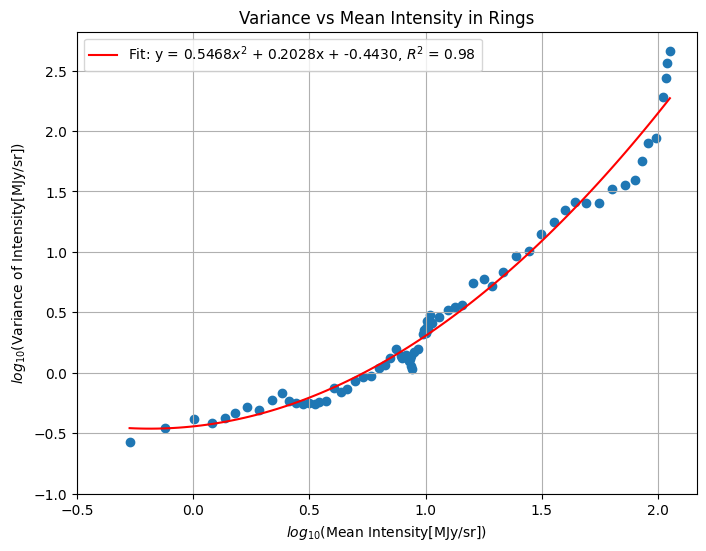

In [10]:
import matplotlib.pyplot as plt
from astropy.io import fits
import numpy as np

# Load the F200W and F444W FITS files
fits_files = ['source/F200W.fits', 'source/F444W.fits']
hduls = [fits.open(fits_file) for fits_file in fits_files]
data = [hdul[0].data for hdul in hduls]
images = [d[:,:,0] for d in data]
image_f200w = images[0]

# make a ring clipping mask
r_in = 22  # inner radius in pixels
r_out = 97  # outer radius in pixels
x_center, y_center = 324.5, 324.5  # center of the ring in pixels
rings = [[] for _ in range(r_in, r_out)]
for x,y in np.ndindex(image_f200w.shape):
    r = np.sqrt((x-x_center)**2 + (y-y_center)**2)
    if r_in <= r <= r_out:
        #print(r, int(r)-r_in)
        rings[int(r)-r_in].append(image_f200w[x,y])

# calculate the mean value and var of each ring
ring_means = [np.mean(ring) for ring in rings]
ring_vars = [np.var(ring, ddof=1) for ring in rings]
ring_means_log = np.log10(ring_means)
ring_vars_log = np.log10(ring_vars)

# Fit a line to the data
coefficients = np.polyfit(ring_means_log, ring_vars_log, 2)
polynomial = np.poly1d(coefficients)
R_squared = 1 - (np.sum((ring_vars_log - polynomial(ring_means_log))**2) / np.sum((ring_vars_log - np.mean(ring_vars_log))**2))
print(f"Fitted line: y = {coefficients[0]:.4f}$x^2$ + {coefficients[1]:.4f}x + {coefficients[2]:.4f}, $R^2$ = {R_squared:.2f}")
# print the coefficients in high precision
print(f"Coefficients: {coefficients[0]:.14f}, {coefficients[1]:.14f}, {coefficients[2]:.14f}")

# Create a scatter plot of var vs mean
plt.figure(figsize=(8, 6))
plt.scatter(ring_means_log, ring_vars_log)
# Plot the fitted line
x_fit = np.linspace(min(ring_means_log), max(ring_means_log), 100)
y_fit = polynomial(x_fit)
plt.plot(x_fit, y_fit, color='red', label=f'Fit: y = {coefficients[0]:.4f}$x^2$ + {coefficients[1]:.4f}x + {coefficients[2]:.4f}, $R^2$ = {R_squared:.2f}')
plt.legend()
plt.xlabel(f'$log_{{10}}$(Mean Intensity[MJy/sr])')
plt.ylabel(f'$log_{{10}}$(Variance of Intensity[MJy/sr])')
plt.title('Variance vs Mean Intensity in Rings')
plt.grid(True)
plt.xlim(-0.5,)
plt.ylim(-1,)
plt.show()

--- Face-on Assumption ---
Fitted line: y = 0.5468x^2 + 0.2028x + -0.4430, R^2 = 0.98
Coefficients: 0.54675111777099, 0.20276353330016, -0.44301507597909

--- Inclined Assumption (Inc=8.74°, PA=165.62°) ---
Fitted line: y = 0.5732x^2 + 0.1395x + -0.4194, R^2 = 0.98
Coefficients: 0.57321016895402, 0.13953233520980, -0.41936335735760


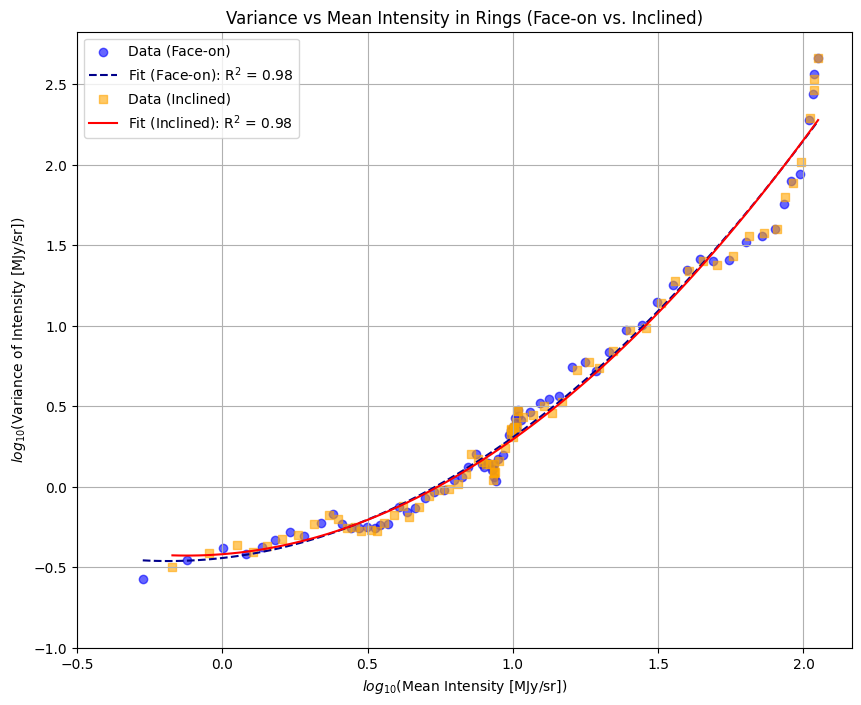

In [11]:
import matplotlib.pyplot as plt
from astropy.io import fits
import numpy as np

# Load the F200W and F444W FITS files
fits_files = ['source/F200W.fits', 'source/F444W.fits']
hduls = [fits.open(fits_file) for fits_file in fits_files]
data = [hdul[0].data for hdul in hduls]
images = [d[:,:,0] for d in data]
image_f200w = images[0]

# --- Parameters ---
r_in = 22   # inner radius in pixels
r_out = 97  # outer radius in pixels
x_center, y_center = 324.5, 324.5  # center of the ring in pixels

# New geometric parameters (Replace with your actual values)
inclination = 8.74  # degrees (0 is face-on)
pa = 90+75.62           # Position Angle in degrees

# Create a coordinate grid to vectorize the distance calculations
y, x = np.indices(image_f200w.shape)
dx = x - x_center
dy = y - y_center

# 1. Face-on (circular) radii
r_faceon = np.sqrt(dx**2 + dy**2)

# 2. Inclined (elliptical) radii
inc_rad = np.radians(inclination)
pa_rad = np.radians(pa)

# Rotate coordinates to align with major/minor axes
x_rot = dx * np.cos(pa_rad) - dy * np.sin(pa_rad)
y_rot = dx * np.sin(pa_rad) + dy * np.cos(pa_rad)

# De-project the minor axis (divide by cos(inclination))
r_inclined = np.sqrt(x_rot**2 + (y_rot / np.cos(inc_rad))**2)

# --- Helper function to extract rings and calculate stats ---
def get_ring_stats(r_matrix, img, r_inner, r_outer):
    # Added +1 to range to prevent IndexError if a calculated radius exactly equals r_outer
    rings = [[] for _ in range(r_inner, r_outer + 1)]
    
    # Vectorized masking is much faster than an ndindex loop
    mask = (r_matrix >= r_inner) & (r_matrix <= r_outer)
    valid_r = r_matrix[mask]
    valid_img = img[mask]
    
    indices = valid_r.astype(int) - r_inner
    for idx, val in zip(indices, valid_img):
        rings[idx].append(val)
        
    # Remove empty rings (if any) to prevent NaN errors in mean/variance calculations
    rings = [r for r in rings if len(r) > 1]

    ring_means = [np.mean(ring) for ring in rings]
    ring_vars = [np.var(ring, ddof=1) for ring in rings]
    
    means_log = np.log10(ring_means)
    vars_log = np.log10(ring_vars)
    
    coeffs = np.polyfit(means_log, vars_log, 2)
    poly = np.poly1d(coeffs)
    r_squared = 1 - (np.sum((vars_log - poly(means_log))**2) / np.sum((vars_log - np.mean(vars_log))**2))
    
    return means_log, vars_log, coeffs, r_squared, poly

# Calculate for both assumptions
means_faceon, vars_faceon, coeffs_faceon, r2_faceon, poly_faceon = get_ring_stats(r_faceon, image_f200w, r_in, r_out)
means_inc, vars_inc, coeffs_inc, r2_inc, poly_inc = get_ring_stats(r_inclined, image_f200w, r_in, r_out)

# Print results
print("--- Face-on Assumption ---")
print(f"Fitted line: y = {coeffs_faceon[0]:.4f}x^2 + {coeffs_faceon[1]:.4f}x + {coeffs_faceon[2]:.4f}, R^2 = {r2_faceon:.2f}")
print(f"Coefficients: {coeffs_faceon[0]:.14f}, {coeffs_faceon[1]:.14f}, {coeffs_faceon[2]:.14f}\n")

print(f"--- Inclined Assumption (Inc={inclination}°, PA={pa}°) ---")
print(f"Fitted line: y = {coeffs_inc[0]:.4f}x^2 + {coeffs_inc[1]:.4f}x + {coeffs_inc[2]:.4f}, R^2 = {r2_inc:.2f}")
print(f"Coefficients: {coeffs_inc[0]:.14f}, {coeffs_inc[1]:.14f}, {coeffs_inc[2]:.14f}")

# --- Plotting ---
plt.figure(figsize=(10, 8))

# Face-on Plot
plt.scatter(means_faceon, vars_faceon, alpha=0.6, color='blue', label='Data (Face-on)')
x_fit_faceon = np.linspace(min(means_faceon), max(means_faceon), 100)
plt.plot(x_fit_faceon, poly_faceon(x_fit_faceon), color='darkblue', linestyle='--', 
         label=f'Fit (Face-on): R$^2$ = {r2_faceon:.2f}')

# Inclined Plot
plt.scatter(means_inc, vars_inc, alpha=0.6, color='orange', marker='s', label='Data (Inclined)')
x_fit_inc = np.linspace(min(means_inc), max(means_inc), 100)
plt.plot(x_fit_inc, poly_inc(x_fit_inc), color='red', 
         label=f'Fit (Inclined): R$^2$ = {r2_inc:.2f}')

plt.legend()
plt.xlabel(f'$log_{{10}}$(Mean Intensity [MJy/sr])')
plt.ylabel(f'$log_{{10}}$(Variance of Intensity [MJy/sr])')
plt.title('Variance vs Mean Intensity in Rings (Face-on vs. Inclined)')
plt.grid(True)
plt.xlim(-0.5,)
plt.ylim(-1,)
plt.show()

<>:74: SyntaxWarning: invalid escape sequence '\m'
<>:74: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_2975570/269680120.py:74: SyntaxWarning: invalid escape sequence '\m'
  axes[0].plot(x_g, y_g, 'r-', lw=2, label='Standard Normal $\mathcal{N}(0, 1)$')


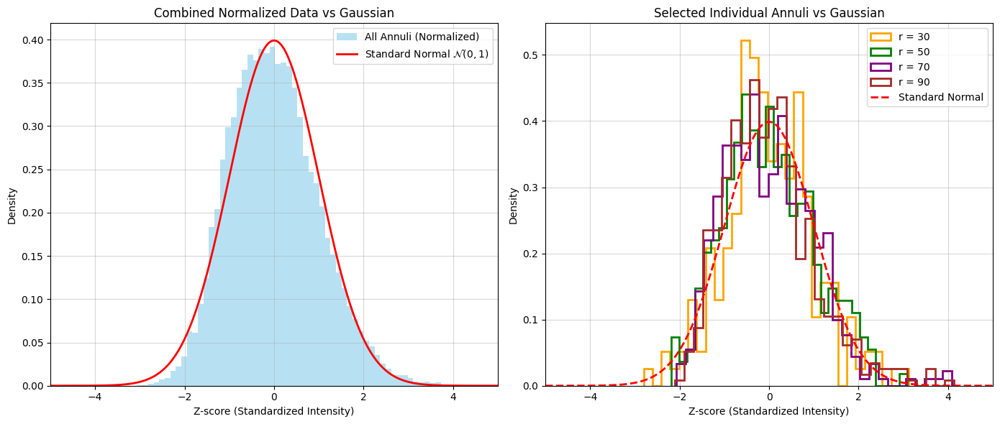

In [12]:
import matplotlib.pyplot as plt
from astropy.io import fits
import numpy as np
import scipy.stats as stats

# Load the F200W FITS file
fits_file = 'source/F200W.fits'
hdul = fits.open(fits_file)
image_f200w = hdul[0].data[:,:,0] # Adjust if your FITS dimensions differ

# --- Parameters ---
r_in = 22   # inner radius in pixels
r_out = 97  # outer radius in pixels
x_center, y_center = 324.5, 324.5  # center of the ring
inclination = 8.74  # degrees (0 is face-on)
pa = 90+75.62           # Position Angle in degrees

# Create coordinate grid
y, x = np.indices(image_f200w.shape)
dx = x - x_center
dy = y - y_center

# Inclined (elliptical) radii calculation
inc_rad = np.radians(inclination)
pa_rad = np.radians(pa)

# Rotate coordinates to align with major/minor axes
x_rot = dx * np.cos(pa_rad) - dy * np.sin(pa_rad)
y_rot = dx * np.sin(pa_rad) + dy * np.cos(pa_rad)

# De-project the minor axis
r_inclined = np.sqrt(x_rot**2 + (y_rot / np.cos(inc_rad))**2)

# --- Extract and Normalize Rings ---
mask = (r_inclined >= r_in) & (r_inclined <= r_out)
valid_r = r_inclined[mask]
valid_img = image_f200w[mask]
indices = valid_r.astype(int) - r_in

# Group pixels into their respective annuli
rings = [[] for _ in range(r_out - r_in + 1)]
for idx, val in zip(indices, valid_img):
    rings[idx].append(val)

all_normalized_data = []
selected_radii = [30, 50, 70, 90] # Specific radii to show individually
selected_norm_data = {}

for r_idx, ring in enumerate(rings):
    if len(ring) > 1:
        ring_arr = np.array(ring)
        mean_val = np.mean(ring_arr)
        std_val = np.std(ring_arr, ddof=1)
        
        # Avoid division by zero
        if std_val > 0:
            # Normalize to Z-score: (x - mu) / sigma
            norm_ring = (ring_arr - mean_val) / std_val
            all_normalized_data.extend(norm_ring)
            
            actual_r = r_idx + r_in
            if actual_r in selected_radii:
                selected_norm_data[actual_r] = norm_ring

# --- Plotting ---
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# X-axis range for the theoretical Gaussian curve
x_g = np.linspace(-5, 5, 1000)
y_g = stats.norm.pdf(x_g, 0, 1)

# Panel 1: Aggregate of all normalized annuli
axes[0].hist(all_normalized_data, bins=100, density=True, alpha=0.6, color='skyblue', label='All Annuli (Normalized)')
axes[0].plot(x_g, y_g, 'r-', lw=2, label='Standard Normal $\mathcal{N}(0, 1)$')
axes[0].set_title('Combined Normalized Data vs Gaussian')
axes[0].set_xlabel('Z-score (Standardized Intensity)')
axes[0].set_ylabel('Density')
axes[0].set_xlim(-5, 5)
axes[0].legend()
axes[0].grid(True, alpha=0.5)

# Panel 2: A few selected annuli
colors = ['orange', 'green', 'purple', 'brown']
for color, r_val in zip(colors, selected_radii):
    if r_val in selected_norm_data:
        data = selected_norm_data[r_val]
        # Using step histograms so the overlapping lines are easy to read
        axes[1].hist(data, bins=30, density=True, histtype='step', lw=2, 
                     color=color, label=f'r = {r_val}')

axes[1].plot(x_g, y_g, 'r--', lw=2, label='Standard Normal')
axes[1].set_title('Selected Individual Annuli vs Gaussian')
axes[1].set_xlabel('Z-score (Standardized Intensity)')
axes[1].set_ylabel('Density')
axes[1].set_xlim(-5, 5)
axes[1].legend()
axes[1].grid(True, alpha=0.5)

plt.tight_layout()
plt.show()

<>:66: SyntaxWarning: invalid escape sequence '\s'
<>:82: SyntaxWarning: invalid escape sequence '\s'
<>:66: SyntaxWarning: invalid escape sequence '\s'
<>:82: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_2975570/1971536291.py:66: SyntaxWarning: invalid escape sequence '\s'
  ax.scatter(x_out, y_out, color='red', s=15, marker='x', label='> 3 $\sigma$ Outliers')
/tmp/ipykernel_2975570/1971536291.py:82: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title('Spatial Distribution of > 3 $\sigma$ Intensity Residuals')


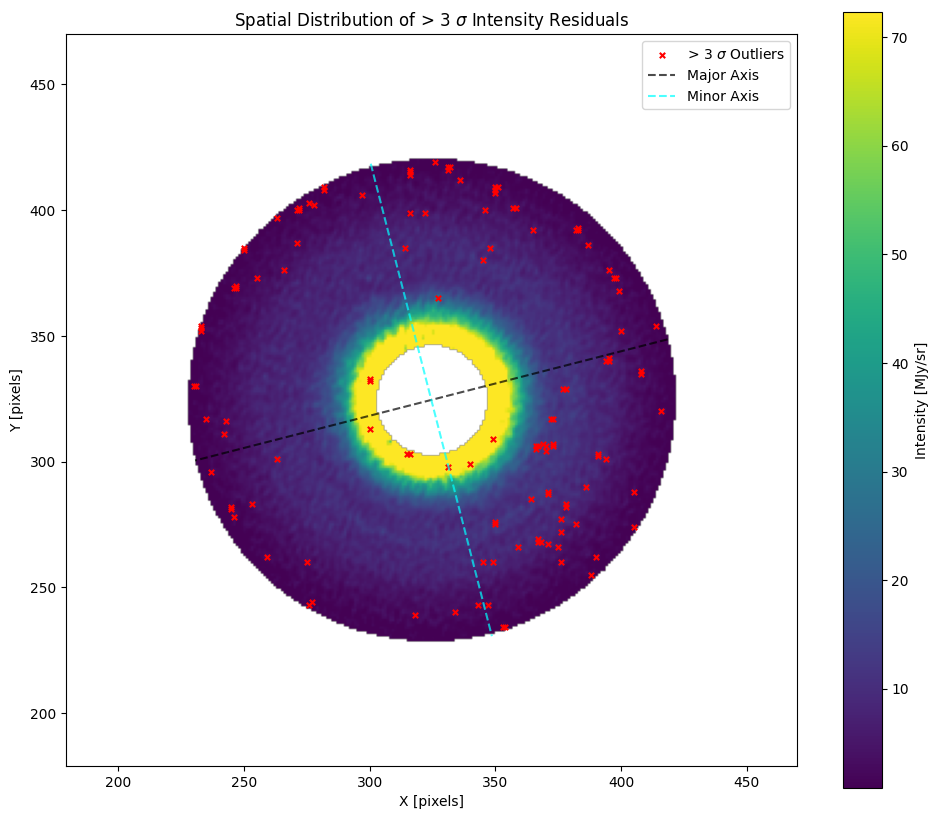

In [13]:
import matplotlib.pyplot as plt
from astropy.io import fits
import numpy as np

# Load data
fits_file = 'source/F200W.fits'
hdul = fits.open(fits_file)
image_f200w = hdul[0].data[:,:,0] 

# --- Parameters ---
r_in = 22
r_out = 97
x_center, y_center = 324.5, 324.5
inclination = 8.74  # degrees
pa = 90+75.62           # Position Angle in degrees

# --- Geometry Setup ---
y, x = np.indices(image_f200w.shape)
dx = x - x_center
dy = y - y_center
inc_rad = np.radians(inclination)
pa_rad = np.radians(pa)

# Rotate and de-project coordinates
x_rot = dx * np.cos(pa_rad) - dy * np.sin(pa_rad)
y_rot = dx * np.sin(pa_rad) + dy * np.cos(pa_rad)
r_inclined = np.sqrt(x_rot**2 + (y_rot / np.cos(inc_rad))**2)

# --- Isolate >3 Sigma Pixels ---
outlier_mask = np.zeros_like(image_f200w, dtype=bool)
disk_mask = (r_inclined >= r_in) & (r_inclined <= r_out)

# Create an array of ring indices (e.g., 0 for r=22, 1 for r=23...)
ring_indices = np.floor(r_inclined - r_in).astype(int)

# Loop through each annulus to find its local outliers
for r_idx in range(r_out - r_in + 1):
    current_ring_mask = disk_mask & (ring_indices == r_idx)
    
    if np.any(current_ring_mask):
        ring_pixels = image_f200w[current_ring_mask]
        
        if len(ring_pixels) > 1:
            mean_val = np.mean(ring_pixels)
            std_val = np.std(ring_pixels, ddof=1)
            
            if std_val > 0:
                # Flag pixels in this specific ring that deviate by > 3 sigma
                outliers_in_ring = current_ring_mask & (np.abs(image_f200w - mean_val) > 3 * std_val)
                outlier_mask |= outliers_in_ring

# --- Plotting ---
fig, ax = plt.subplots(figsize=(10, 10))

# To make the outliers pop, we'll plot the disk but grey out the background
display_img = np.copy(image_f200w)
display_img[~disk_mask] = np.nan 

# Use a colormap with vmin/vmax to show disk structure without getting blown out
im = ax.imshow(display_img, origin='lower', cmap='viridis', 
               vmin=np.nanpercentile(display_img, 5), 
               vmax=np.nanpercentile(display_img, 95))

# Plot the > 3 sigma outliers
y_out, x_out = np.where(outlier_mask)
ax.scatter(x_out, y_out, color='red', s=15, marker='x', label='> 3 $\sigma$ Outliers')

# Draw Major and Minor Axes to directly address comment 2c
line_len = r_out 

# The inverse rotation maps axes back to image coordinates
# Major Axis (y_rot = 0)
ax.plot([x_center - line_len*np.cos(pa_rad), x_center + line_len*np.cos(pa_rad)],
        [y_center + line_len*np.sin(pa_rad), y_center - line_len*np.sin(pa_rad)], 
        color='black', linestyle='--', alpha=0.7, label='Major Axis')

# Minor Axis (x_rot = 0)
ax.plot([x_center - line_len*np.sin(pa_rad), x_center + line_len*np.sin(pa_rad)],
        [y_center - line_len*np.cos(pa_rad), y_center + line_len*np.cos(pa_rad)], 
        color='cyan', linestyle='--', alpha=0.7, label='Minor Axis')

ax.set_title('Spatial Distribution of > 3 $\sigma$ Intensity Residuals')
ax.set_xlabel('X [pixels]')
ax.set_xlim(x_center-1.5*r_out, x_center+1.5*r_out)
ax.set_ylim(y_center-1.5*r_out, y_center+1.5*r_out)
ax.set_ylabel('Y [pixels]')
ax.legend(loc='upper right')
plt.colorbar(im, ax=ax, label='Intensity [MJy/sr]', shrink=0.8)

plt.tight_layout()
plt.show()

Cropped image shape: (196, 196) Cropped image shape: (96, 96)
pixel_scales: [0.03068494, 0.062424185]
total brightness: 922502.4
total brightness: 30544.484
resized_image brightness: 922612.75
cropped_images shape: (96, 96)


/tmp/ipykernel_2975570/4038481113.py:58: RuntimeWarning: invalid value encountered in log10
  plt.imshow(-100**(0.2)*np.log10(resized_image/cropped_images[1])+100**(0.2)*np.log10(823.27/236.43), vmin=-3, vmax=3, cmap='RdBu_r', extent=extent, origin='lower')


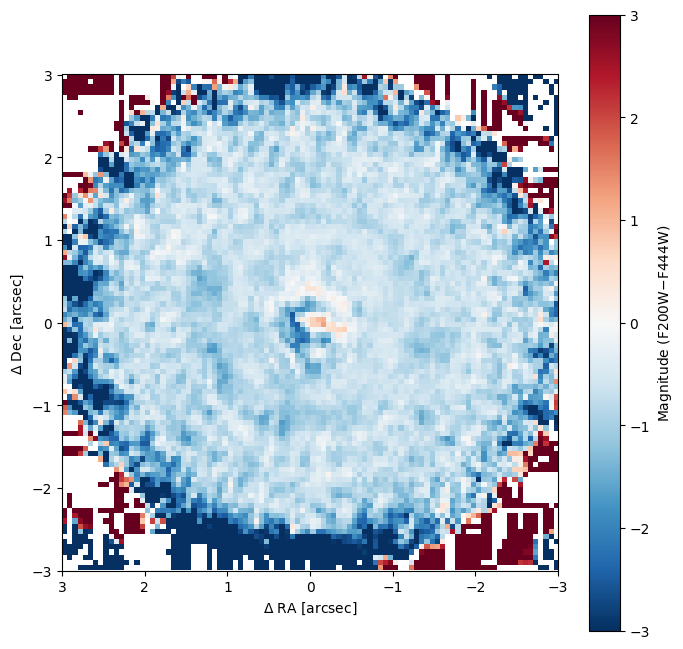

In [14]:
# Color difference plot F200W-F444W, TW Hya

import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from skimage.transform import resize

# Load the F200W and F444W FITS files
fits_files = ['source/F200W.fits', 'source/F444W.fits']
hduls = [fits.open(fits_file) for fits_file in fits_files]
data = [hdul[0].data for hdul in hduls]
images = [d[:,:,0] for d in data]

# Read headers
headers = [hdul[0].header for hdul in hduls]

# parameters
pixel_scales = [header['PIXSCALE'] for header in headers]  # in arcsec/pixel
dist = 60.14 # distance to TW Hya in pc

# Image dimensions and center
ny, nx = images[0].shape
center_y, center_x = (ny - 1) / 2.0, (nx - 1) / 2.0

# --- Plot Original Image ---
plt.figure(figsize=(8, 8), dpi=100)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [half_extent, -half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = [extent_arcsec / ps for ps in pixel_scales]
half_extent_pix = [ep / 2 for ep in extent_pixels]

# Create a cropped view centered on the image
x_starts = [int(center_x - hep) for hep in half_extent_pix]
x_ends = [int(center_x + hep) for hep in half_extent_pix]
y_starts = [int(center_y - hep) for hep in half_extent_pix]
y_ends = [int(center_y + hep) for hep in half_extent_pix]

cropped_images = []
for y_start, y_end, x_start, x_end, i in zip(y_starts, y_ends, x_starts, x_ends, range(len(images))):
    cropped_image = images[i][y_start:y_end, x_start:x_end]
    cropped_images.append(cropped_image)

print("Cropped image shape:", cropped_images[0].shape, "Cropped image shape:", cropped_images[1].shape)
print("pixel_scales:", pixel_scales)

resized_image = resize(cropped_images[0], cropped_images[1].shape, order=3, mode='reflect', anti_aliasing=False)
for i in range(len(cropped_images)):
    print("total brightness:", np.sum(cropped_images[i]))
    
print("resized_image brightness:", np.sum(resized_image)*196*196/96/96)
print("cropped_images shape:", resized_image.shape)

plt.imshow(-100**(0.2)*np.log10(resized_image/cropped_images[1])+100**(0.2)*np.log10(823.27/236.43), vmin=-3, vmax=3, cmap='RdBu_r', extent=extent, origin='lower')
plt.colorbar(label=r'Magnitude (F200W$-$F444W)')
plt.xlabel(r'$\Delta$ RA [arcsec]')
plt.ylabel(r'$\Delta$ Dec [arcsec]')

plt.show()

wh_min, wh_max (arcsec): 4.41863136, 5.952878360000001
x_offset, y_offset: 0.02086575920000021 0.002147945799999791


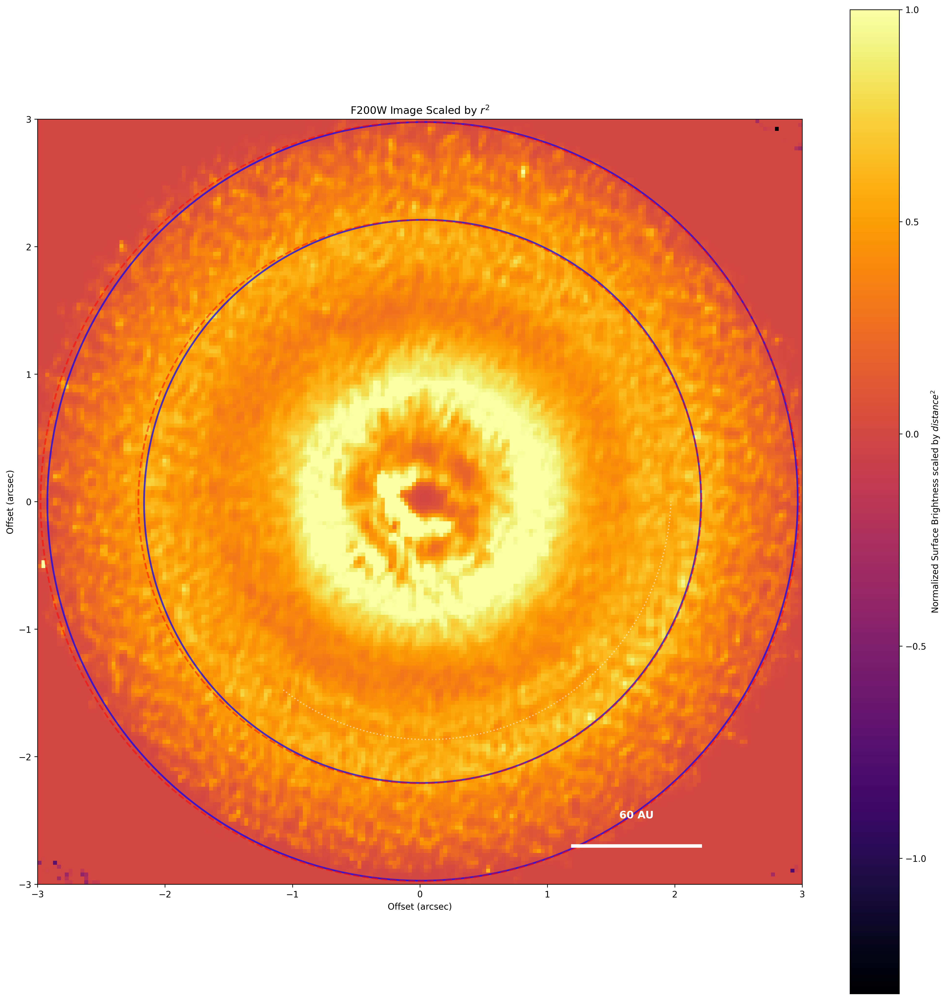

In [15]:

import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
import numpy as np

# Load the F200W and F444W FITS files
fits_files = ['source/F200W.fits', 'source/F444W.fits']
hduls = [fits.open(fits_file) for fits_file in fits_files]
data = [hdul[0].data for hdul in hduls]
images = [d[:,:,0] for d in data]

# Create a figure with a single subplot
fig, ax = plt.subplots(1, 1, figsize=(16, 16), dpi=300)

# --- Scaled Original Image Plot ---
# Note: some variables are defined in other cells, like 'images', 'pixel_scales', 'dist'

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 6 arcsecond scope
half_extent = extent_arcsec / 2
extent = [-half_extent, half_extent, -half_extent, half_extent]

# Use images[0] for consistency (F200W)
image_f200w = images[0]
pixel_scale_f200w = pixel_scales[0]
ny_f200w, nx_f200w = image_f200w.shape
center_y_f200w, center_x_f200w = (ny_f200w - 1) / 2.0, (nx_f200w - 1) / 2.0

# Calculate the pixel range corresponding to the extent
extent_pixels_f200w = extent_arcsec / pixel_scale_f200w
half_extent_pix_f200w = extent_pixels_f200w / 2

# Create a cropped view centered on the image
x_start_f200w = int(center_x_f200w - half_extent_pix_f200w)
x_end_f200w = int(center_x_f200w + half_extent_pix_f200w)
y_start_f200w = int(center_y_f200w - half_extent_pix_f200w)
y_end_f200w = int(center_y_f200w + half_extent_pix_f200w)

# Ensure we don't go outside image bounds
x_start_f200w = max(0, x_start_f200w)
x_end_f200w = min(nx_f200w, x_end_f200w)
y_start_f200w = max(0, y_start_f200w)
y_end_f200w = min(ny_f200w, y_end_f200w)

cropped_image_f200w = image_f200w[y_start_f200w:y_end_f200w, x_start_f200w:x_end_f200w]

# distance of each pixel in arcseconds
distances = np.empty_like(cropped_image_f200w)
for i in range(cropped_image_f200w.shape[0]):
    for j in range(cropped_image_f200w.shape[1]):
        # Calculate distance from the center in arcseconds
        distances[i, j] = np.sqrt(((y_start_f200w + i) - center_y_f200w)**2 + ((x_start_f200w + j) - center_x_f200w)**2) * pixel_scale_f200w

# Normalize the image by maximum value and scale by distance^2
scaled_image = cropped_image_f200w * distances**2
normalized_image = scaled_image / np.nanpercentile(scaled_image, 97)
im = ax.imshow(normalized_image, origin='lower', cmap='inferno',
           vmax=1.0,
           extent=extent)

# Add 1" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

ax.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
ax.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist:.0f} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# add a ellipse to indicate the inclination and position angle of the disk
wh_min = 2*72.0 * pixel_scale_f200w # arcseconds
wh_max = 2*97.0 * pixel_scale_f200w # arcseconds
print(f"wh_min, wh_max (arcsec): {wh_min}, {wh_max}")

x_offset = (325.18-324.5) * pixel_scale_f200w
y_offset = (324.57-324.5) * pixel_scale_f200w
inclination = 8.65  # degrees
position_angle = 77.25  # degrees
print("x_offset, y_offset:", x_offset, y_offset)

ellipse_blue1 = Ellipse((x_offset, y_offset), width=wh_min, height=wh_min * np.cos(np.radians(inclination)), angle=position_angle,
                  edgecolor='blue', facecolor='none', linestyle='-', linewidth=2, alpha=0.7)
ax.add_patch(ellipse_blue1)

ellipse_blue2 = Ellipse((x_offset, y_offset), width=wh_max, height=wh_max * np.cos(np.radians(inclination)), angle=position_angle,
                  edgecolor='blue', facecolor='none', linestyle='-', linewidth=2, alpha=0.7)
ax.add_patch(ellipse_blue2)

ellipse_red1 = Ellipse((0, 0), width=wh_min, height=wh_min, angle=position_angle,
                  edgecolor='red', facecolor='none', linestyle='--', linewidth=2, alpha=0.5)
ax.add_patch(ellipse_red1)

ellipse_red2 = Ellipse((0, 0), width=wh_max, height=wh_max, angle=position_angle,
                  edgecolor='red', facecolor='none', linestyle='--', linewidth=2, alpha=0.5)
ax.add_patch(ellipse_red2)

# Add log spiral with a slope of 2 degrees
theta = np.linspace(-0.7 * np.pi, 0, 100)
r_spiral = 1.97* np.exp(np.tan(np.radians(2)) * theta)
x_spiral = r_spiral * np.cos(theta)
y_spiral = r_spiral * np.sin(theta)
ax.plot(x_spiral, y_spiral, color='white', linestyle=':', label='Log Spiral', alpha=0.5)

fig.colorbar(im, ax=ax, label=r'Normalized Surface Brightness scaled by $distance^2$')
ax.set_xlabel('Offset (arcsec)')
ax.set_ylabel('Offset (arcsec)')
ax.set_title('F200W Image Scaled by $r^2$')

plt.tight_layout()
plt.show()

/tmp/ipykernel_2975570/4203036440.py:33: RuntimeWarning: invalid value encountered in log10
  magnitude_difference = -100**(0.2)*np.log10(resized_image/cropped_images[1])+100**(0.2)*np.log10(829.37/227.32)


wh_min, wh_max (arcsec): 1.35013736, 5.952878360000001
x_offset, y_offset: 0.01350137359999993 -0.005216439800000488


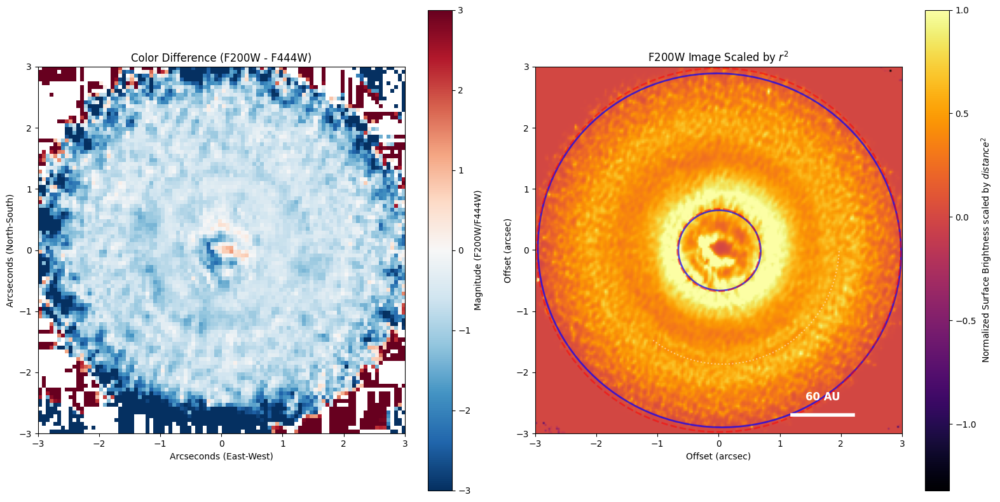

In [16]:
import matplotlib.pyplot as plt
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8), dpi=100)

# --- First Plot: Color difference ---
# This part of the code is for the first subplot (ax1)
# Note: some variables are defined in the first cell, like 'images', 'pixel_scales', 'dist', 'center_x', 'center_y'

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [-half_extent, half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = [extent_arcsec / ps for ps in pixel_scales]
half_extent_pix = [ep / 2 for ep in extent_pixels]

# Create a cropped view centered on the image
x_starts = [int(center_x - hep) for hep in half_extent_pix]
x_ends = [int(center_x + hep) for hep in half_extent_pix]
y_starts = [int(center_y - hep) for hep in half_extent_pix]
y_ends = [int(center_y + hep) for hep in half_extent_pix]

# It seems there was a bug in the original code, it was cropping images[0] twice.
# I am correcting it to crop images[0] and images[1]
cropped_images = []
for i, (y_start, y_end, x_start, x_end) in enumerate(zip(y_starts, y_ends, x_starts, x_ends)):
    cropped_image = images[i][y_start:y_end, x_start:x_end]
    cropped_images.append(cropped_image)

resized_image = resize(cropped_images[0], cropped_images[1].shape, order=3, mode='reflect', anti_aliasing=False)

magnitude_difference = -100**(0.2)*np.log10(resized_image/cropped_images[1])+100**(0.2)*np.log10(829.37/227.32)

im1 = ax1.imshow(magnitude_difference, vmin=-3, vmax=3, cmap='RdBu_r', extent=extent, origin='lower')
fig.colorbar(im1, ax=ax1, label='Magnitude (F200W/F444W)')
ax1.set_xlabel('Arcseconds (East-West)')
ax1.set_ylabel('Arcseconds (North-South)')
ax1.set_title('Color Difference (F200W - F444W)')


# --- Second Plot: Scaled Original Image ---
# This part of the code is for the second subplot (ax2)
# It uses 'image' which is defined in cell 3 as data from F200W.fits. Let's use images[0] for consistency.
image_f200w = images[0]
pixel_scale_f200w = pixel_scales[0]
ny_f200w, nx_f200w = image_f200w.shape
center_y_f200w, center_x_f200w = (ny_f200w - 1) / 2.0, (nx_f200w - 1) / 2.0

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels_f200w = extent_arcsec / pixel_scale_f200w
half_extent_pix_f200w = extent_pixels_f200w / 2

# Create a cropped view centered on the image
x_start_f200w = int(center_x_f200w - half_extent_pix_f200w)
x_end_f200w = int(center_x_f200w + half_extent_pix_f200w)
y_start_f200w = int(center_y_f200w - half_extent_pix_f200w)
y_end_f200w = int(center_y_f200w + half_extent_pix_f200w)

# Ensure we don't go outside image bounds
x_start_f200w = max(0, x_start_f200w)
x_end_f200w = min(nx_f200w, x_end_f200w)
y_start_f200w = max(0, y_start_f200w)
y_end_f200w = min(ny_f200w, y_end_f200w)

cropped_image_f200w = image_f200w[y_start_f200w:y_end_f200w, x_start_f200w:x_end_f200w]

# distance of each pixel in arcseconds
distances = np.empty_like(cropped_image_f200w)
for i in range(cropped_image_f200w.shape[0]):
    for j in range(cropped_image_f200w.shape[1]):
        # Calculate distance from the center in arcseconds
        distances[i, j] = np.sqrt(((y_start_f200w + i) - center_y_f200w)**2 + ((x_start_f200w + j) - center_x_f200w)**2) * pixel_scale_f200w

# Normalize the image by maximum value and scale by distance^2
scaled_image = cropped_image_f200w * distances**2
normalized_image = scaled_image / np.nanpercentile(scaled_image, 97)
im2 = ax2.imshow(normalized_image, origin='lower', cmap='inferno',
           vmax=1.0,
           extent=extent)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

ax2.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
ax2.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist:.0f} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# add a ellipse to indicate the inclination and position angle of the disk
from matplotlib.patches import Ellipse
wh_min = 2*22.0 * pixel_scale_f200w # arcseconds
wh_max = 2*97.0 * pixel_scale_f200w # arcseconds
print(f"wh_min, wh_max (arcsec): {wh_min}, {wh_max}")

x_offset = (324.94-324.5) * pixel_scale_f200w
y_offset = (324.33-324.5) * pixel_scale_f200w
inclination = 13.88  # degrees
position_angle = 164.89  # degrees
print("x_offset, y_offset:", x_offset, y_offset)

ellipse = Ellipse((x_offset, y_offset), width=wh_min, height=wh_min * np.cos(np.radians(inclination)), angle=position_angle,
                  edgecolor='blue', facecolor='none', linestyle='-', linewidth=2, alpha=0.7)
ax2.add_patch(ellipse)

ellipse = Ellipse((x_offset, y_offset), width=wh_max, height=wh_max * np.cos(np.radians(inclination)), angle=position_angle,
                  edgecolor='blue', facecolor='none', linestyle='-', linewidth=2, alpha=0.7)
ax2.add_patch(ellipse)

ellipse = Ellipse((0, 0), width=wh_min, height=wh_min, angle=position_angle,
                  edgecolor='red', facecolor='none', linestyle='--', linewidth=2, alpha=0.5)
ax2.add_patch(ellipse)

ellipse = Ellipse((0, 0), width=wh_max, height=wh_max, angle=position_angle,
                  edgecolor='red', facecolor='none', linestyle='--', linewidth=2, alpha=0.5)
ax2.add_patch(ellipse)

# Add log spiral with a slope of 2 degrees
theta = np.linspace(-0.7 * np.pi, 0, 100)
r_spiral = 1.97* np.exp(np.tan(np.radians(2)) * theta)
x_spiral = r_spiral * np.cos(theta)
y_spiral = r_spiral * np.sin(theta)
ax2.plot(x_spiral, y_spiral, color='white', linestyle=':', label='Log Spiral', alpha=0.5)

fig.colorbar(im2, ax=ax2, label=r'Normalized Surface Brightness scaled by $distance^2$')
ax2.set_xlabel('Offset (arcsec)')
ax2.set_ylabel('Offset (arcsec)')
ax2.set_title('F200W Image Scaled by $r^2$')

plt.tight_layout()
plt.show()


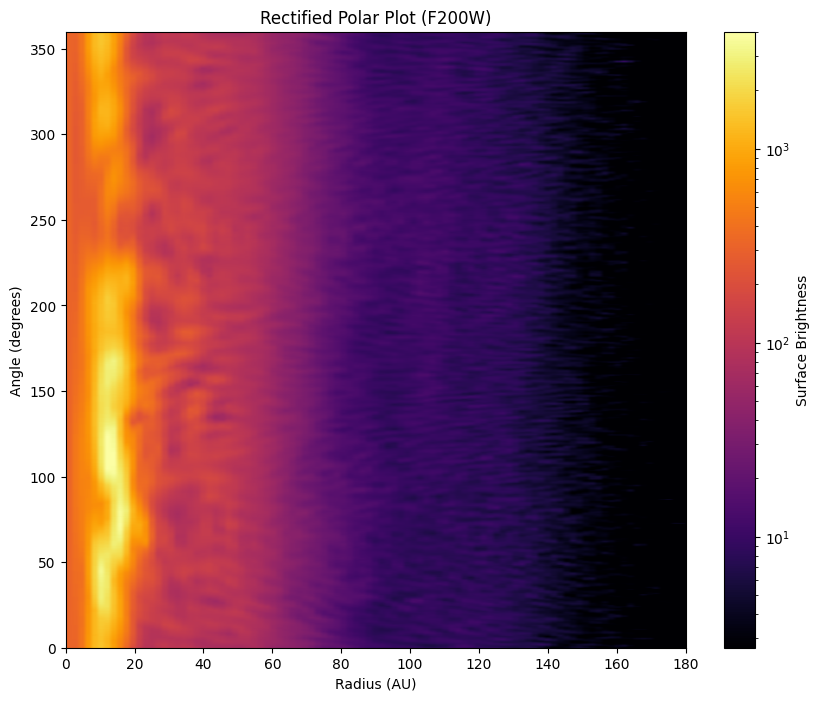

In [17]:
# Rectified Polar Plot
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from matplotlib.colors import LogNorm
from scipy.ndimage import map_coordinates

# Load the FITS file
fits_file = 'source/F200W.fits'
hdul = fits.open(fits_file)
data = hdul[0].data
image = data[:,:,0]

# Read header
header = hdul[0].header
# print(header) # You can uncomment this to see the header details
pixel_scale = header['PIXSCALE'] # in arcsec/pixel
dist = 60.14 # distance to TW Hya in pc

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(image, 99.975)

# --- Polar transform ---

# Image dimensions and center
ny, nx = image.shape
center_y, center_x = (ny - 1) / 2.0, (nx - 1) / 2.0

# Define the polar grid
# The radius is the distance from the center to the corner.
max_radius_pix = np.sqrt(center_y**2 + center_x**2)
nr = int(max_radius_pix)
ntheta = 720 # number of angular points

radii_pix = np.linspace(0, max_radius_pix, nr)
thetas = np.linspace(0, 2 * np.pi, ntheta)

# Create a grid of polar coordinates
r_grid, theta_grid = np.meshgrid(radii_pix, thetas)

# Convert polar to Cartesian coordinates
x_cart = r_grid * np.cos(theta_grid + np.pi/2) + center_x
y_cart = r_grid * np.sin(theta_grid + np.pi/2) + center_y

# The coordinates for map_coordinates should be in a (2, N) array
coords = np.array([y_cart.ravel(), x_cart.ravel()])

# Perform the transformation
polar_image = map_coordinates(image, coords, order=1, mode='constant', cval=np.nan).reshape((ntheta, nr))

# plot the image
plt.figure(figsize=(10, 8), dpi=100)
plt.imshow(polar_image, origin='lower', cmap='inferno', 
           norm=LogNorm(vmin=clim_low_raw, vmax=clim_high_raw),
           aspect='auto', extent=[0, max_radius_pix*pixel_scale*dist, 0, 360])

# Set x limit to 0 to 200 AU
plt.xlim(0, 180)
plt.colorbar(label='Surface Brightness')
filter_name = fits_file.split('/')[-1].split('.')[0]
plt.title(f'Rectified Polar Plot ({filter_name})')
plt.ylabel('Angle (degrees)')
plt.xlabel('Radius (AU)')
plt.savefig('rectified_polar.png')
plt.show()

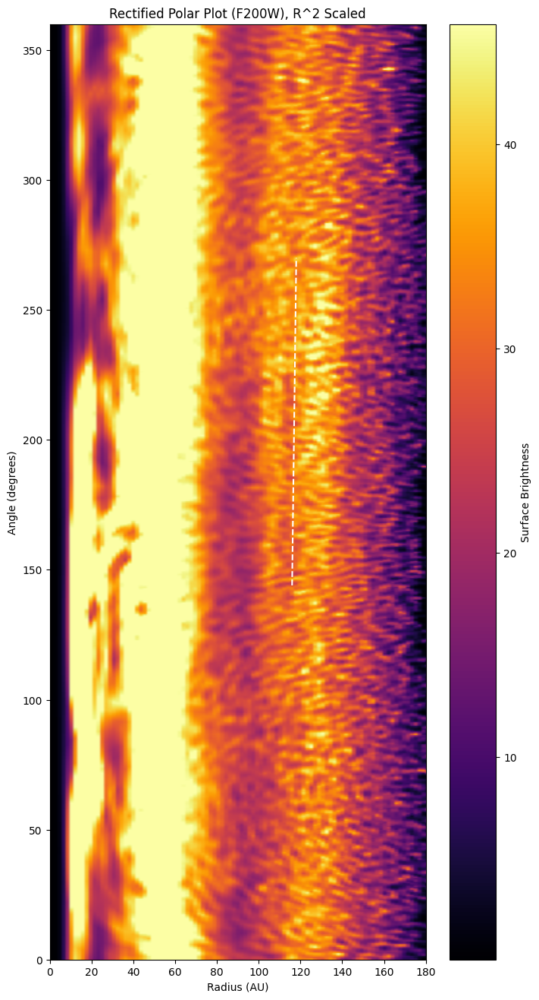

In [18]:
# Apply R^2 scaling to enhance outer features
radii_arcsec = radii_pix * pixel_scale
polar_image_r2_scaled = np.zeros_like(polar_image)
for i in range(polar_image.shape[1]):
    if radii_arcsec[i] > 0:
        polar_image_r2_scaled[:, i] = polar_image[:, i] * (radii_arcsec[i]**2)

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 0.7]) * np.nanpercentile(polar_image_r2_scaled, 97)

# plot the image
plt.figure(figsize=(8, 16), dpi=100)
plt.imshow(polar_image_r2_scaled, origin='lower', cmap='inferno', 
           vmin=clim_low_raw, vmax=clim_high_raw,
           aspect='auto', extent=[0, max_radius_pix*pixel_scale*dist, 0, 360])

# add a sloped line at 110 AU with slope 2 degrees to the vertical axis
x = np.array([116, 118])
y = np.array([144, 270])
plt.plot(x, y, color='white', linestyle='--', label='Slope = 2 degrees')

# Set x limit to 0 to 200 AU
plt.xlim(0, 180)
plt.colorbar(label='Surface Brightness')
filter_name = fits_file.split('/')[-1].split('.')[0]
plt.title(f'Rectified Polar Plot ({filter_name}), R^2 Scaled')
plt.ylabel('Angle (degrees)')
plt.xlabel('Radius (AU)')
plt.savefig('rectified_polar.png')
plt.show()

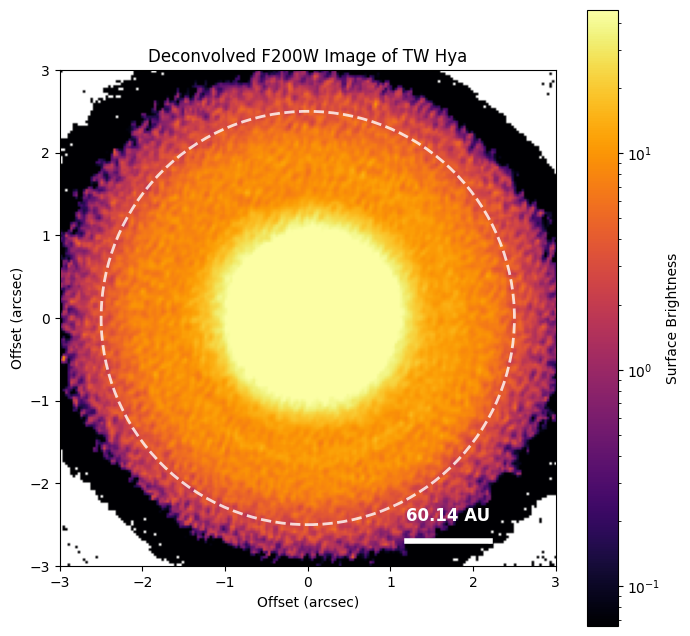

In [19]:
# --- Plot Original Image ---
plt.figure(figsize=(8, 8), dpi=100)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [-half_extent, half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = extent_arcsec / pixel_scale
half_extent_pix = extent_pixels / 2

# Create a cropped view centered on the image
x_start = int(center_x - half_extent_pix)
x_end = int(center_x + half_extent_pix)
y_start = int(center_y - half_extent_pix)
y_end = int(center_y + half_extent_pix)

# Ensure we don't go outside image bounds
x_start = max(0, x_start)
x_end = min(nx, x_end)
y_start = max(0, y_start)
y_end = min(ny, y_end)

cropped_image = image[y_start:y_end, x_start:x_end]

plt.imshow(cropped_image, origin='lower', cmap='inferno', 
           norm=LogNorm(vmin=clim_low_raw, vmax=clim_high_raw),
           extent=extent)

# Add reference circle at 5" radius (actually 2.5" radius since extent goes from -2.5 to +2.5)
circle = plt.Circle((0, 0), 2.5, fill=False, color='white', linewidth=2, linestyle='--', alpha=0.8)
plt.gca().add_patch(circle)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

plt.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
plt.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# Convert extent to AU for secondary labels
extent_au = np.array(extent) * dist  # Convert arcsec to AU

plt.colorbar(label='Surface Brightness')
plt.title(f'Deconvolved {filter_name} Image of TW Hya')

# Set primary axes labels in arcseconds
plt.xlabel('Offset (arcsec)')
plt.ylabel('Offset (arcsec)')

plt.savefig('original_image.png', dpi=300, bbox_inches='tight')
plt.show()


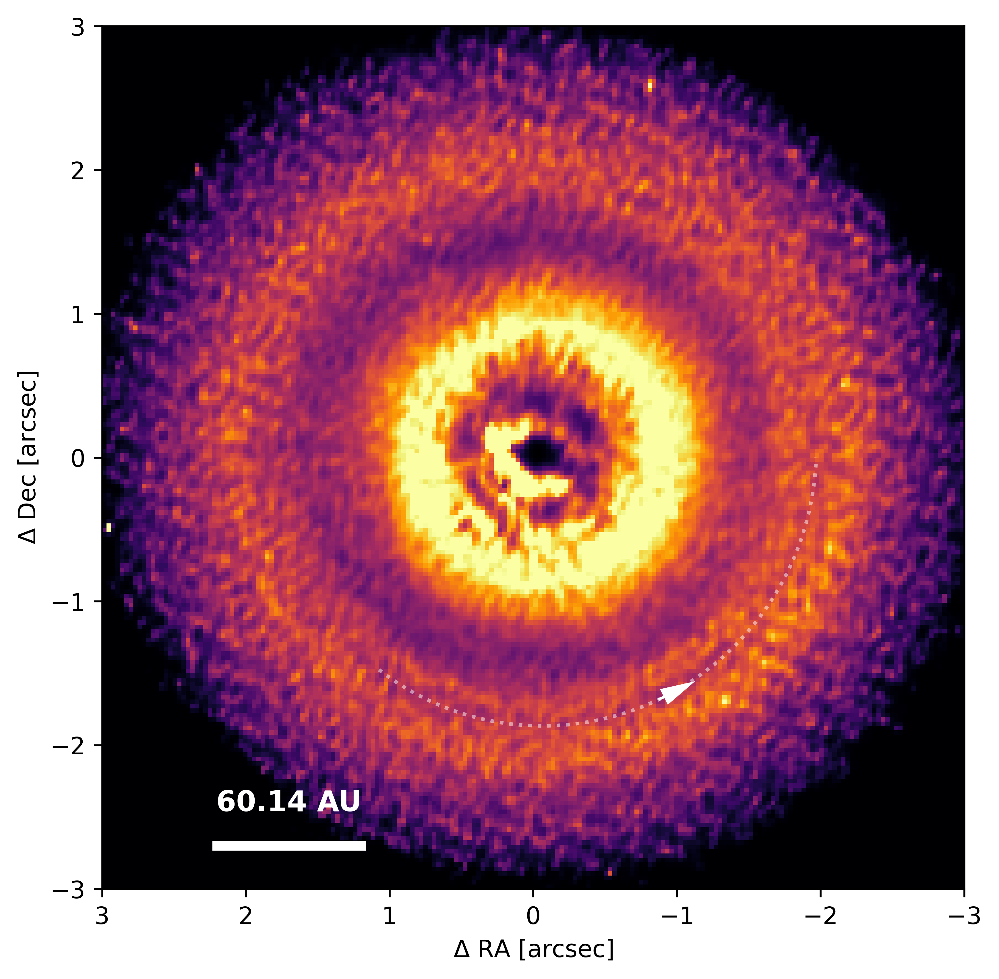

In [20]:
# --- Plot Original Image ---
plt.figure(figsize=(6.5, 6.5), dpi=600)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [half_extent, -half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = extent_arcsec / pixel_scale
half_extent_pix = extent_pixels / 2

# Create a cropped view centered on the image
x_start = int(center_x - half_extent_pix)
x_end = int(center_x + half_extent_pix)
y_start = int(center_y - half_extent_pix)
y_end = int(center_y + half_extent_pix)

# Ensure we don't go outside image bounds
x_start = max(0, x_start)
x_end = min(nx, x_end)
y_start = max(0, y_start)
y_end = min(ny, y_end)

cropped_image = image[y_start:y_end, x_start:x_end]

# distance of each pixel in arcseconds
distances = np.empty_like(cropped_image)
for i in range(cropped_image.shape[0]):
    for j in range(cropped_image.shape[1]):
        # Calculate distance from the center in arcseconds
        distances[i, j] = np.sqrt(((y_start + i) - center_y)**2 + ((x_start + j) - center_x)**2) * pixel_scale

# Normalize the image by maximum value and scale by distance^2
scaled_image = cropped_image * distances**2
normalized_image = scaled_image / np.nanpercentile(scaled_image, 97)
plt.imshow(normalized_image, origin='lower', cmap='inferno',
           vmax=1.0, vmin=0.0,
           extent=extent)

# Add reference circle at 5" radius (actually 2.5" radius since extent goes from -2.5 to +2.5)
#circle = plt.Circle((0, 0), 2.5, fill=False, color='white', linewidth=2, linestyle='--', alpha=0.8)
#plt.gca().add_patch(circle)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

plt.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
plt.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# Add log spiral with a slope of 2 degrees
theta = np.linspace(-0.7 * np.pi, 0, 100)
r_spiral = 1.97* np.exp(np.tan(np.radians(2)) * theta)
x_spiral = r_spiral * np.cos(theta)
y_spiral = r_spiral * np.sin(theta)
plt.plot(-x_spiral, y_spiral, color='white', linestyle=':', label='Log Spiral', alpha=0.5)

# Add a arrow indicating the log spiral direction
plt.arrow( -r_spiral[50]*np.cos(theta[50]), r_spiral[50]*np.sin(theta[50]),
           -0.5*(r_spiral[51]-r_spiral[50])*np.cos(theta[50])-r_spiral[50]*(-np.sin(theta[50])*(theta[51]-theta[50])),
           0.5*(r_spiral[51]-r_spiral[50])*np.sin(theta[50])+r_spiral[50]*(np.cos(theta[50])*(theta[51]-theta[50])),
           head_width=0.1, head_length=0.2, fc='white', ec='white')
           
# Add vertical (to the spiral) lines at the start and end of the spiral
'''
plt.plot([r_spiral[0]*np.cos(theta[0]) - 0.1/2**0.5, r_spiral[0]*np.cos(theta[0]) + 0.1/2**0.5],
         [r_spiral[0]*np.sin(theta[0]) - 0.1/2**0.5, r_spiral[0]*np.sin(theta[0]) + 0.1/2**0.5],
         color='white', linestyle='-', alpha=1)
plt.plot([r_spiral[-1]*np.cos(theta[-1]) + 0.1, r_spiral[-1]*np.cos(theta[-1]) - 0.1],
         [r_spiral[-1]*np.sin(theta[-1]), r_spiral[-1]*np.sin(theta[-1])],
         color='white', linestyle='-')
'''
# Convert extent to AU for secondary labels
extent_au = np.array(extent) * dist  # Convert arcsec to AU

#plt.colorbar(label=r'Normalized Surface Brightness scaled by $distance^2$')
#plt.title(f'Deconvolved {filter_name} Image of TW Hya')

# Set primary axes labels in arcseconds
plt.xlabel(r'$\Delta$ RA [arcsec]')
plt.ylabel(r'$\Delta$ Dec [arcsec]')

plt.savefig('original_image.png', dpi=600, bbox_inches='tight')
plt.show()

Radius 39 au: Max at 182.5 deg, Min at 27.3 deg
Radius 53 au: Max at 237.6 deg, Min at 357.7 deg
Radius 88 au: Max at 247.6 deg, Min at 12.3 deg
Radius 141 au: Max at 252.6 deg, Min at 357.7 deg


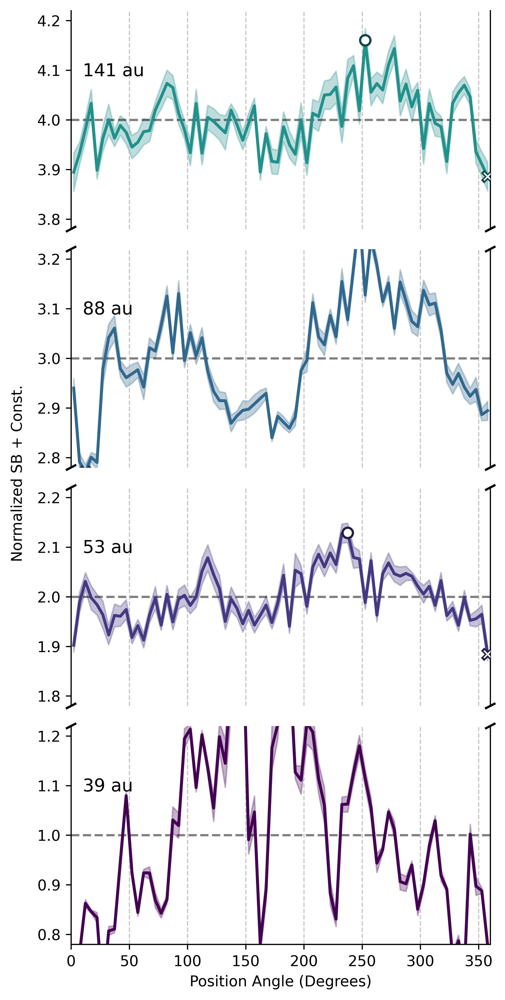

In [22]:
import numpy as np
import matplotlib.pyplot as plt

# Define the y-ranges you want to display
y_ranges = [(0.78, 1.22), (1.78, 2.22), (2.78, 3.22), (3.78, 4.22)]

# Create a figure with one column and a number of rows equal to your ranges
fig, axes = plt.subplots(len(y_ranges), 1, sharex=True, figsize=(5, 10), dpi=600)
fig.subplots_adjust(hspace=0)

# ==========================================
# BINNING PARAMETERS (in pixels)
# ==========================================
r_bin_size_pix = 5    # Number of pixels to bin in the radial direction
theta_bin_size_pix = 10  # Number of pixels to bin in the azimuthal (theta) direction

# Radii of interest in au
radii_au = np.array([39, 53, 88, 141])

# Convert au to pixels (assuming dist and pixel_scale are defined in your environment)
radii_pix_interest = (radii_au / dist) / pixel_scale

# Find the closest index in our radii_pix array
radii_indices = [np.argmin(np.abs(radii_pix - r)) for r in radii_pix_interest]

# Angles in degrees (assuming thetas is defined in your environment)
angles_deg = np.rad2deg(thetas)

# Create a list of colors for the plots
colors = plt.cm.viridis(np.linspace(0, 0.5, len(radii_au)))

# --- Plot each profile on its corresponding subplot ---
for i, ax in enumerate(axes[::-1]):
    radius_au = radii_au[i]
    radius_idx = radii_indices[i]
    
    # 1. Radial Binning: Extract the annulus slice
    start_idx = max(0, radius_idx - r_bin_size_pix // 2)
    end_idx = min(polar_image.shape[1], start_idx + r_bin_size_pix)
    annulus_data = polar_image[:, start_idx:end_idx]
    
    # 2. Theta Binning: Reshape the array into 2D bin chunks
    num_theta_bins = annulus_data.shape[0] // theta_bin_size_pix
    if num_theta_bins == 0: continue # Skip if bin size is larger than the image height
    
    # Truncate arrays to be exact multiples of theta_bin_size_pix
    annulus_data_trunc = annulus_data[:num_theta_bins * theta_bin_size_pix, :]
    angles_deg_trunc = angles_deg[:num_theta_bins * theta_bin_size_pix]
    
    # Reshape to (num_theta_bins, theta_bin_size_pix, r_pixels)
    binned_data = annulus_data_trunc.reshape(num_theta_bins, theta_bin_size_pix, annulus_data_trunc.shape[1])
    
    # Bin the angle array
    angles_binned = np.nanmean(angles_deg_trunc.reshape(num_theta_bins, theta_bin_size_pix), axis=1)
    
    # 3. Calculate metrics across both dimensions of the 2D bins (axis 1 for theta, axis 2 for r)
    profile = np.nanmean(binned_data, axis=(1, 2))
    std_dev = np.nanstd(binned_data, axis=(1, 2))
    
    # Count valid (non-NaN) pixels in each 2D bin to correctly calculate standard error
    pixel_count = np.sum(~np.isnan(binned_data), axis=(1, 2))
    
    # Protect against division by zero
    with np.errstate(divide='ignore', invalid='ignore'):
        yerr = np.where(pixel_count > 0, std_dev / np.sqrt(pixel_count), 0)
    
    profile_mean = np.nanmean(profile)
    if np.isnan(profile_mean) or profile_mean == 0: continue

    # Add offset to separate the plots
    offset = i
    
    normalized_profile = profile / profile_mean + offset
    normalized_yerr = yerr / profile_mean
    
    color = colors[i]
    
    # Set the y-limits for this specific subplot
    ax.set_ylim(y_ranges[i])

    # Add dashed line at the mean level
    ax.axhline(y=offset + 1, linestyle='--', color='black', alpha=0.5)
    
    upper_bound = normalized_profile + normalized_yerr
    lower_bound = normalized_profile - normalized_yerr
    
    # Use the binned angles for plotting
    ax.fill_between(angles_binned, lower_bound, upper_bound, alpha=0.3, color=color)
    ax.plot(angles_binned, normalized_profile, '-', color=color, linewidth=2)
    
    # Add text annotation for the radius
    ax.text(10, y_ranges[i][0] + 0.7 * (y_ranges[i][1] - y_ranges[i][0]), f'{radius_au} au', fontsize=12,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.0))
    
    # Mark the maximum and minimum points
    max_idx = np.nanargmax(normalized_profile)
    min_idx = np.nanargmin(normalized_profile)
    darker_color = np.copy(color)
    darker_color[:3] = darker_color[:3] * 0.5 
    
    ax.plot(angles_binned[max_idx], normalized_profile[max_idx], 'o', color='white', markersize=7, markeredgecolor=darker_color, markeredgewidth=1.5, zorder=5) 
    ax.plot(angles_binned[min_idx], normalized_profile[min_idx], 'x', color=darker_color, markersize=7, markeredgewidth=3)
    ax.plot(angles_binned[min_idx], normalized_profile[min_idx], 'x', color='white', markersize=5, markeredgewidth=1, zorder=5)
    print(f'Radius {radius_au} au: Max at {angles_binned[max_idx]:.1f} deg, Min at {angles_binned[min_idx]:.1f} deg')

    # --- Add break marks and clean up spines ---
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='x', which='both', bottom=False, top=False)
    
    d = .01 
    kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
    if i < len(axes)-1: 
        ax.plot((-d, +d), (1 - d, 1 + d), **kwargs)
        ax.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)
    if i > 0: 
        ax.plot((-d, +d), (-d, +d), **kwargs)
        ax.plot((1 - d, 1 + d), (-d, +d), **kwargs)
    ax.grid(axis='x', linestyle='--', alpha=0.7)

# --- Final plot adjustments ---
axes[-1].spines['bottom'].set_visible(True)
axes[-1].tick_params(axis='x', which='both', bottom=True)
axes[-1].set_xlim(0, 360)
axes[-1].set_xlabel('Position Angle (Degrees)')

fig.text(0.06, 0.5, 'Normalized SB + Const.', va='center', rotation='vertical')

plt.tight_layout(rect=[0.08, 0, 1, 0.95])
plt.savefig('azimuthal_distribution_broken_axis_binned.png', dpi=300, bbox_inches='tight')
plt.show()

# F444W

### HPFRDI Image

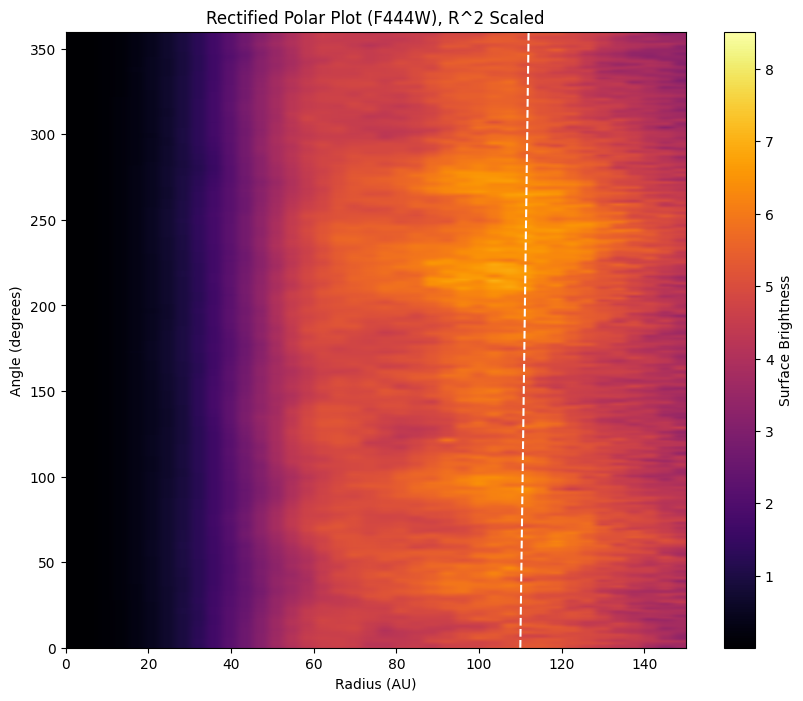

In [34]:
# --- Diagnostic: Check Radial Brightness Profile ---
# Apply R^2 scaling to enhance outer features
radii_arcsec = radii_pix * pixel_scale
polar_image_r2_scaled = np.zeros_like(polar_image)
for i in range(polar_image.shape[1]):
    if radii_arcsec[i] > 0:
        polar_image_r2_scaled[:, i] = polar_image[:, i] * (radii_arcsec[i]**2)

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(polar_image_r2_scaled, 97)

# plot the image
plt.figure(figsize=(10, 8), dpi=100)
plt.imshow(polar_image_r2_scaled, origin='lower', cmap='inferno', 
           vmin=clim_low_raw, vmax=clim_high_raw,
           aspect='auto', extent=[0, max_radius_pix*pixel_scale*dist, 0, 360])

# add a sloped line at 110 AU with slope 2 degrees to the vertical axis
x = np.array([110, 112])
y = np.array([0, 360])
plt.plot(x, y, color='white', linestyle='--', label='Slope = 2 degrees')

# Set x limit to 0 to 200 AU
plt.xlim(0, 150)
plt.colorbar(label='Surface Brightness')
filter_name = fits_file.split('/')[-1].split('.')[0]
plt.title(f'Rectified Polar Plot ({filter_name}), R^2 Scaled')
plt.ylabel('Angle (degrees)')
plt.xlabel('Radius (AU)')
plt.savefig('rectified_polar.png')
plt.show()

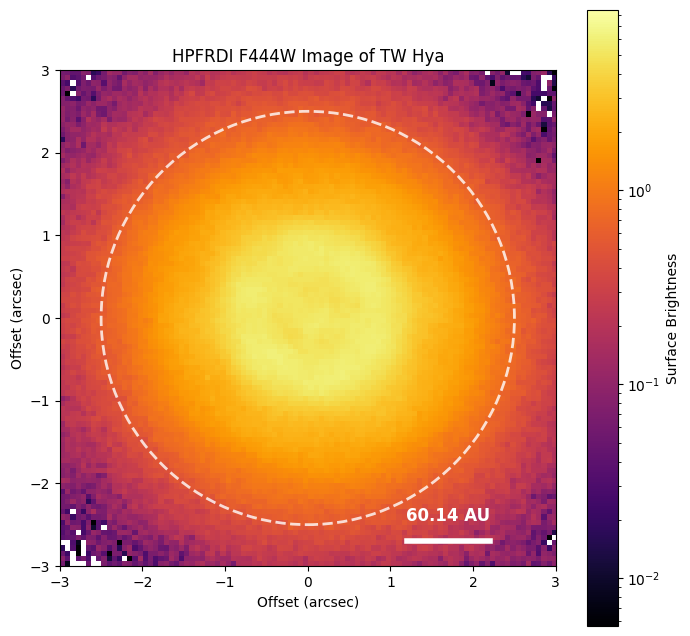

In [35]:
# --- Plot Original Image ---
plt.figure(figsize=(8, 8), dpi=100)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [-half_extent, half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = extent_arcsec / pixel_scale
half_extent_pix = extent_pixels / 2

# Create a cropped view centered on the image
x_start = int(center_x - half_extent_pix)
x_end = int(center_x + half_extent_pix)
y_start = int(center_y - half_extent_pix)
y_end = int(center_y + half_extent_pix)

# Ensure we don't go outside image bounds
x_start = max(0, x_start)
x_end = min(nx, x_end)
y_start = max(0, y_start)
y_end = min(ny, y_end)

cropped_image = image[y_start:y_end, x_start:x_end]

plt.imshow(cropped_image, origin='lower', cmap='inferno', 
           norm=LogNorm(vmin=clim_low_raw, vmax=clim_high_raw),
           extent=extent)

# Add reference circle at 5" radius (actually 2.5" radius since extent goes from -2.5 to +2.5)
circle = plt.Circle((0, 0), 2.5, fill=False, color='white', linewidth=2, linestyle='--', alpha=0.8)
plt.gca().add_patch(circle)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

plt.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
plt.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# Convert extent to AU for secondary labels
extent_au = np.array(extent) * dist  # Convert arcsec to AU

plt.colorbar(label='Surface Brightness')
plt.title(f'HPFRDI {filter_name} Image of TW Hya')

# Set primary axes labels in arcseconds
plt.xlabel('Offset (arcsec)')
plt.ylabel('Offset (arcsec)')

plt.savefig('original_image.png', dpi=300, bbox_inches='tight')
plt.show()

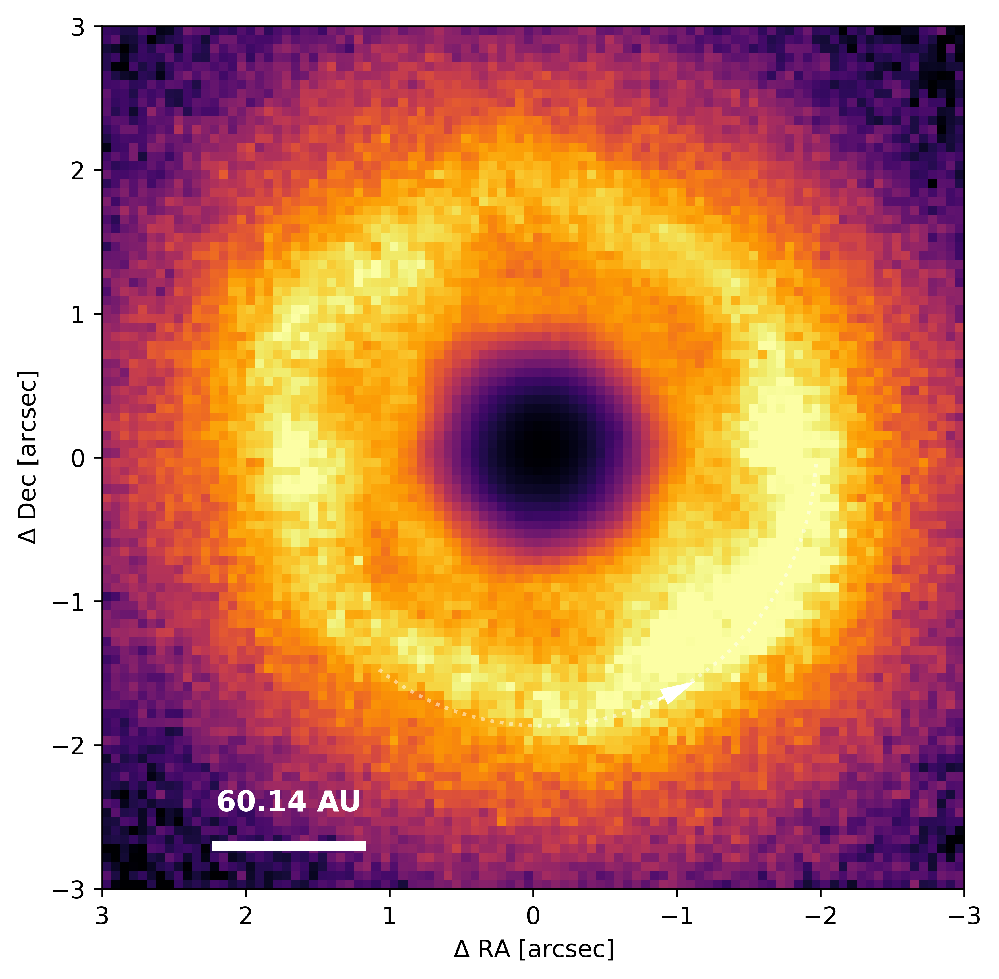

In [36]:
# --- Plot Original Image ---
plt.figure(figsize=(6.5, 6.5), dpi=600)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [half_extent, -half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = extent_arcsec / pixel_scale
half_extent_pix = extent_pixels / 2

# Create a cropped view centered on the image
x_start = int(center_x - half_extent_pix)
x_end = int(center_x + half_extent_pix)
y_start = int(center_y - half_extent_pix)
y_end = int(center_y + half_extent_pix)

# Ensure we don't go outside image bounds
x_start = max(0, x_start)
x_end = min(nx, x_end)
y_start = max(0, y_start)
y_end = min(ny, y_end)

cropped_image = image[y_start:y_end, x_start:x_end]

# distance of each pixel in arcseconds
distances = np.empty_like(cropped_image)
for i in range(cropped_image.shape[0]):
    for j in range(cropped_image.shape[1]):
        # Calculate distance from the center in arcseconds
        distances[i, j] = np.sqrt(((y_start + i) - center_y)**2 + ((x_start + j) - center_x)**2) * pixel_scale

# Normalize the image by maximum value and scale by distance^2
scaled_image = cropped_image * distances**2
normalized_image = scaled_image / np.nanpercentile(scaled_image, 97)
plt.imshow(normalized_image, origin='lower', cmap='inferno',
           vmax=1.0, vmin=0.0,
           extent=extent)

# Add reference circle at 5" radius (actually 2.5" radius since extent goes from -2.5 to +2.5)
#circle = plt.Circle((0, 0), 2.5, fill=False, color='white', linewidth=2, linestyle='--', alpha=0.8)
#plt.gca().add_patch(circle)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

plt.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
plt.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# Add log spiral with a slope of 2 degrees
theta = np.linspace(-0.7 * np.pi, 0, 100)
r_spiral = 1.97* np.exp(np.tan(np.radians(2)) * theta)
x_spiral = r_spiral * np.cos(theta)
y_spiral = r_spiral * np.sin(theta)
plt.plot(-x_spiral, y_spiral, color='white', linestyle=':', label='Log Spiral', alpha=0.5)

# Add a arrow indicating the log spiral direction
plt.arrow( -r_spiral[50]*np.cos(theta[50]), r_spiral[50]*np.sin(theta[50]),
           -0.5*(r_spiral[51]-r_spiral[50])*np.cos(theta[50])-r_spiral[50]*(-np.sin(theta[50])*(theta[51]-theta[50])),
           0.5*(r_spiral[51]-r_spiral[50])*np.sin(theta[50])+r_spiral[50]*(np.cos(theta[50])*(theta[51]-theta[50])),
           head_width=0.1, head_length=0.2, fc='white', ec='white')
           
# Add vertical (to the spiral) lines at the start and end of the spiral
'''
plt.plot([r_spiral[0]*np.cos(theta[0]) - 0.1/2**0.5, r_spiral[0]*np.cos(theta[0]) + 0.1/2**0.5],
         [r_spiral[0]*np.sin(theta[0]) - 0.1/2**0.5, r_spiral[0]*np.sin(theta[0]) + 0.1/2**0.5],
         color='white', linestyle='-', alpha=1)
plt.plot([r_spiral[-1]*np.cos(theta[-1]) + 0.1, r_spiral[-1]*np.cos(theta[-1]) - 0.1],
         [r_spiral[-1]*np.sin(theta[-1]), r_spiral[-1]*np.sin(theta[-1])],
         color='white', linestyle='-')
'''
# Convert extent to AU for secondary labels
extent_au = np.array(extent) * dist  # Convert arcsec to AU

#plt.colorbar(label=r'Normalized Surface Brightness scaled by $distance^2$')
#plt.title(f'Deconvolved {filter_name} Image of TW Hya')

# Set primary axes labels in arcseconds
plt.xlabel(r'$\Delta$ RA [arcsec]')
plt.ylabel(r'$\Delta$ Dec [arcsec]')

plt.savefig('original_image.png', dpi=600, bbox_inches='tight')
plt.show()

total pixels in annulus: 192
Radius 39 au: Max at 172.6 deg, Min at 59.9 deg (Bin Width: 84.38 deg, Resolution: 1.88 deg)
total pixels in annulus: 272
Radius 53 au: Max at 219.0 deg, Min at 27.5 deg (Bin Width: 59.56 deg, Resolution: 1.32 deg)
total pixels in annulus: 456
Radius 88 au: Max at 219.6 deg, Min at 6.1 deg (Bin Width: 35.53 deg, Resolution: 0.79 deg)
total pixels in annulus: 724
Radius 141 au: Max at 242.4 deg, Min at 349.9 deg (Bin Width: 22.38 deg, Resolution: 0.50 deg)


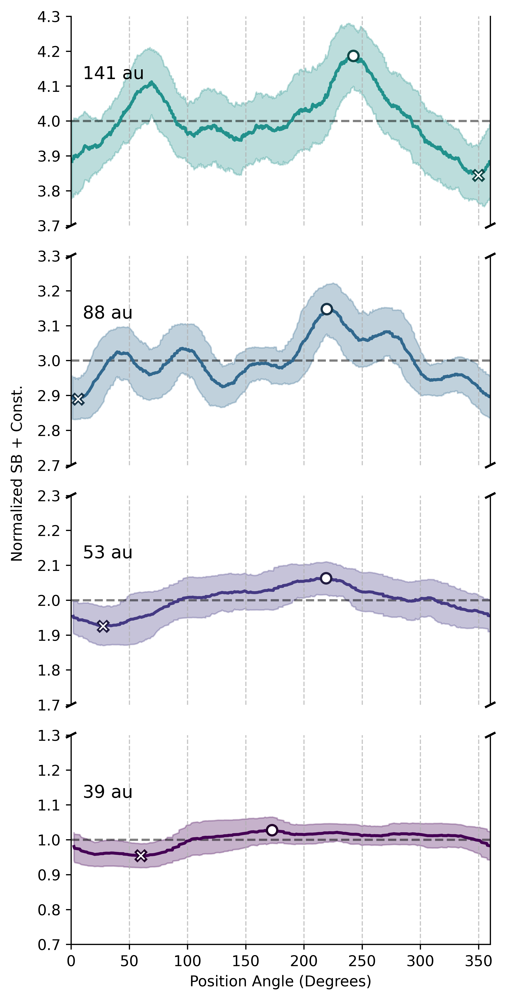

In [45]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from numpy.lib.stride_tricks import sliding_window_view

# Load the FITS file
fits_file = 'source/F444W.fits'
hdul = fits.open(fits_file)
data = hdul[0].data
image = data[:, :, 1]

# Read header
header = hdul[0].header
pixel_scale = header['PIXSCALE'] 
dist = 60.14 

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(image, 99.975)

# --- Configurations & Inputs ---
y_ranges = [(0.7, 1.3), (1.7, 2.3), (2.7, 3.3), (3.7, 4.3)]
radii_au = np.array([39, 53, 88, 141])

r_bin_size_pix = 3
theta_bin_size_pix = 15
beam_size_pix = 40.925618490290482 # beam size in pixels used for error calculation

# --- Cartesian Coordinate Grid Setup ---

# Image dimensions and center
ny, nx = image.shape
center_y, center_x = (ny - 1) / 2.0, (nx - 1) / 2.0

# Generate 2D grids of pixel indices
y_indices, x_indices = np.indices(image.shape)
dy = y_indices - center_y
dx = x_indices - center_x

# Calculate the physical radius (in pixels) for every pixel
r_grid = np.sqrt(dx**2 + dy**2)

# Calculate position angle
theta_grid_rad = np.arctan2(-dx, dy)
theta_grid_deg = np.rad2deg(theta_grid_rad) % 360.0

# --- Setup Figure ---
fig, axes = plt.subplots(len(y_ranges), 1, sharex=True, figsize=(5, 10), dpi=600)
fig.subplots_adjust(hspace=0)
colors = plt.cm.viridis(np.linspace(0, 0.5, len(radii_au)))

# Pre-calculate padding widths for 1D sliding window
pad_before = theta_bin_size_pix*r_bin_size_pix // 2
pad_after = theta_bin_size_pix*r_bin_size_pix - pad_before - 1

# --- Direct Pixel-by-Pixel Binning ---
for i, ax in enumerate(axes[::-1]):
    radius_au = radii_au[i]
    radius_pix = (radius_au / dist) / pixel_scale
    offset = i
    
    # 1. Extract and Sort Pixels in Radial Annulus
    radial_mask = np.abs(r_grid - radius_pix) <= (r_bin_size_pix / 2.0)
    annulus_vals = image[radial_mask]
    annulus_angles = theta_grid_deg[radial_mask]
    print("total pixels in annulus:", len(annulus_vals))
    
    # Sort the unordered Cartesian pixels by position angle to form a 1D ring
    sort_idx = np.argsort(annulus_angles)
    sorted_angles = annulus_angles[sort_idx]
    sorted_vals = annulus_vals[sort_idx]
    
    # 2. Wrap Boundaries for Sliding Window
    padded_vals = np.pad(sorted_vals, (pad_before, pad_after), mode='wrap')
    
    # 3. Vectorized Sliding Window
    # Moves a theta_bin_size_pix * r_bin_size_pix window along the sorted 1D array, 1 pixel at a time
    windows = sliding_window_view(padded_vals, theta_bin_size_pix*r_bin_size_pix)
    profile = np.nanmean(windows, axis=1)
    std_dev = np.nanstd(windows, axis=1)
    pixel_count = np.sum(~np.isnan(windows), axis=1)
    
    # 4. Error and Normalization
    with np.errstate(divide='ignore', invalid='ignore'):
        yerr = np.where(pixel_count > 0, std_dev / np.sqrt(pixel_count / beam_size_pix), 0)
        
    profile_mean = np.nanmean(profile)
    normalized_profile = profile / profile_mean + offset
    normalized_yerr = yerr / profile_mean
    
    # 5. Snap Curve Exactly to 360 Degrees for Plotting
    angles_binned = np.append(sorted_angles, sorted_angles[0] + 360.0)
    normalized_profile = np.append(normalized_profile, normalized_profile[0])
    normalized_yerr = np.append(normalized_yerr, normalized_yerr[0])
    
    # 6. Plotting
    ax.set_ylim(y_ranges[i])
    ax.axhline(y=offset + 1, linestyle='--', color='black', alpha=0.5)
    
    upper_bound = normalized_profile + normalized_yerr
    lower_bound = normalized_profile - normalized_yerr
    color = colors[i]
    
    ax.fill_between(angles_binned, lower_bound, upper_bound, alpha=0.3, color=color)
    ax.plot(angles_binned, normalized_profile, '-', color=color, linewidth=2)
    ax.text(10, y_ranges[i][0] + 0.7 * (y_ranges[i][1] - y_ranges[i][0]), f'{radius_au} au', fontsize=12)
    
    # 7. Markers and Info
    max_idx = np.nanargmax(normalized_profile[:-1])
    min_idx = np.nanargmin(normalized_profile[:-1])
    
    # Calculate dynamic physical bin width (average angular span of the 15 pixels)
    mean_d_theta_deg = (theta_bin_size_pix*r_bin_size_pix / len(sorted_angles)) * 360.0
    resolution_deg = 360.0 / len(sorted_angles)
    
    print(f'Radius {radius_au} au: Max at {angles_binned[max_idx]:.1f} deg, '
          f'Min at {angles_binned[min_idx]:.1f} deg '
          f'(Bin Width: {mean_d_theta_deg:.2f} deg, Resolution: {resolution_deg:.2f} deg)')
    
    darker_color = color * [0.5, 0.5, 0.5, 1.0] 
    
    ax.plot(angles_binned[max_idx], normalized_profile[max_idx], 'o', color='white', markersize=7, markeredgecolor=darker_color, markeredgewidth=1.5, zorder=5) 
    ax.plot(angles_binned[min_idx], normalized_profile[min_idx], 'x', color=darker_color, markersize=7, markeredgewidth=3)
    ax.plot(angles_binned[min_idx], normalized_profile[min_idx], 'x', color='white', markersize=5, markeredgewidth=1, zorder=5)
    
    # 8. Axes Aesthetics
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='x', which='both', bottom=False, top=False)
    
    d = .01 
    kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
    if i < len(axes) - 1: 
        ax.plot((-d, +d), (1 - d, 1 + d), **kwargs)
        ax.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)
    if i > 0: 
        ax.plot((-d, +d), (-d, +d), **kwargs)
        ax.plot((1 - d, 1 + d), (-d, +d), **kwargs)
    ax.grid(axis='x', linestyle='--', alpha=0.7)

# --- Final Layout Adjustment & Output ---
axes[-1].spines['bottom'].set_visible(True)
axes[-1].tick_params(axis='x', which='both', bottom=True)
axes[-1].set_xlim(0, 360)
axes[-1].set_xlabel('Position Angle (Degrees)')

fig.text(0.06, 0.5, 'Normalized SB + Const.', va='center', rotation='vertical')
plt.tight_layout(rect=[0.08, 0, 1, 0.95])
plt.savefig('azimuthal_shadow_f444w.png', dpi=300, bbox_inches='tight')
plt.show()

### Deconvolved Image

Data loaded and polar transformation complete.


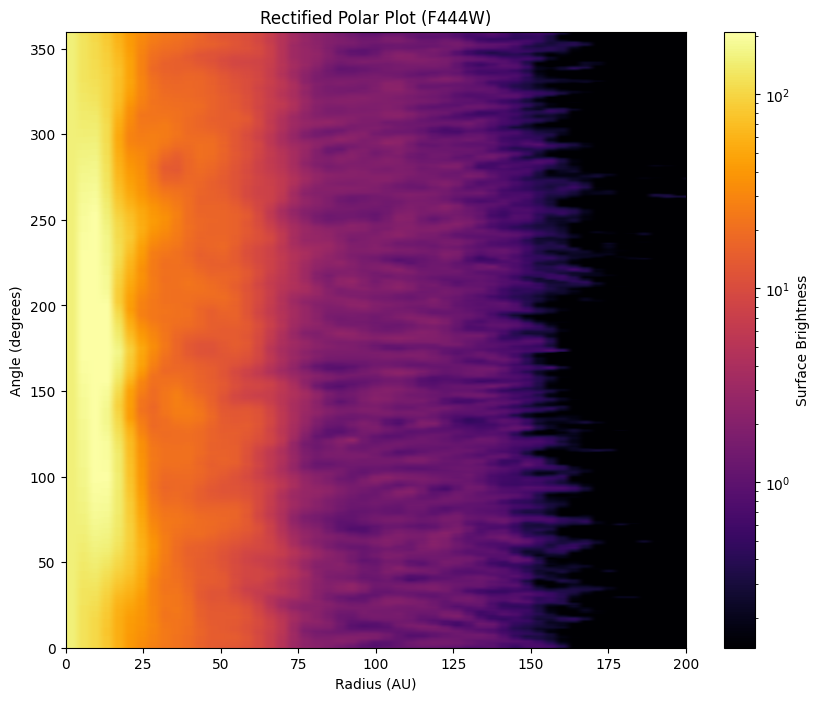

In [57]:
# Rectified Polar Plot
# Read fits file at source/F200W.fits
# Plot the data in a rectified polar plot

import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from matplotlib.colors import LogNorm
from scipy.ndimage import map_coordinates

# Load the FITS file
fits_file = 'source/F444W.fits'
hdul = fits.open(fits_file)
data = hdul[0].data
image = data[:,:,0]

# Read header
header = hdul[0].header
# print(header) # You can uncomment this to see the header details
pixel_scale = header['PIXSCALE'] # in arcsec/pixel
dist = 60.14 # distance to TW Hya in pc

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(image, 99.975)

# --- Polar transform ---

# Image dimensions and center
ny, nx = image.shape
center_y, center_x = (ny - 1) / 2.0, (nx - 1) / 2.0

# Define the polar grid
# The radius is the distance from the center to the corner.
max_radius_pix = np.sqrt(center_y**2 + center_x**2)
nr = int(max_radius_pix)
ntheta = 720 # number of angular points

radii_pix = np.linspace(0, max_radius_pix, nr)
thetas = np.linspace(0, 2 * np.pi, ntheta)

# Create a grid of polar coordinates
r_grid, theta_grid = np.meshgrid(radii_pix, thetas)

# Convert polar to Cartesian coordinates
x_cart = r_grid * np.cos(theta_grid + np.pi/2) + center_x
y_cart = r_grid * np.sin(theta_grid + np.pi/2) + center_y

# The coordinates for map_coordinates should be in a (2, N) array
coords = np.array([y_cart.ravel(), x_cart.ravel()])

# Perform the transformation
polar_image = map_coordinates(image, coords, order=1, mode='constant', cval=np.nan).reshape((ntheta, nr))
print("Data loaded and polar transformation complete.")

# plot the image
plt.figure(figsize=(10, 8), dpi=100)
plt.imshow(polar_image, origin='lower', cmap='inferno', 
           norm=LogNorm(vmin=clim_low_raw, vmax=clim_high_raw),
           aspect='auto', extent=[0, max_radius_pix*pixel_scale*dist, 0, 360])

# Set x limit to 0 to 200 AU
plt.xlim(0, 200)
plt.colorbar(label='Surface Brightness')
filter_name = fits_file.split('/')[-1].split('.')[0]
plt.title(f'Rectified Polar Plot ({filter_name})')
plt.ylabel('Angle (degrees)')
plt.xlabel('Radius (AU)')
plt.savefig('rectified_polar.png')
plt.show()

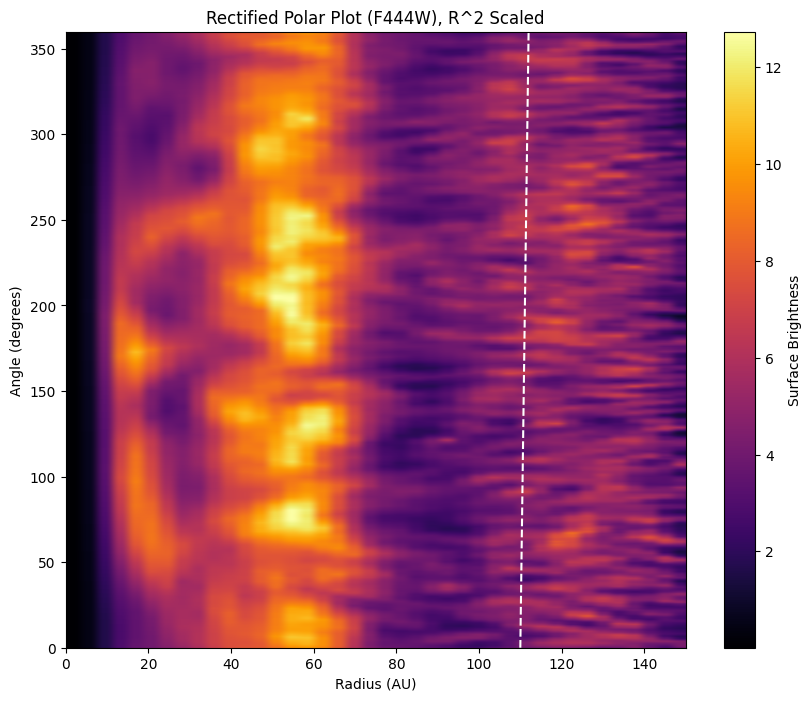

In [58]:
# --- Diagnostic: Check Radial Brightness Profile ---
# Apply R^2 scaling to enhance outer features
radii_arcsec = radii_pix * pixel_scale
polar_image_r2_scaled = np.zeros_like(polar_image)
for i in range(polar_image.shape[1]):
    if radii_arcsec[i] > 0:
        polar_image_r2_scaled[:, i] = polar_image[:, i] * (radii_arcsec[i]**2)

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(polar_image_r2_scaled, 97)

# plot the image
plt.figure(figsize=(10, 8), dpi=100)
plt.imshow(polar_image_r2_scaled, origin='lower', cmap='inferno', 
           vmin=clim_low_raw, vmax=clim_high_raw,
           aspect='auto', extent=[0, max_radius_pix*pixel_scale*dist, 0, 360])

# add a sloped line at 110 AU with slope 2 degrees to the vertical axis
x = np.array([110, 112])
y = np.array([0, 360])
plt.plot(x, y, color='white', linestyle='--', label='Slope = 2 degrees')

# Set x limit to 0 to 200 AU
plt.xlim(0, 150)
plt.colorbar(label='Surface Brightness')
filter_name = fits_file.split('/')[-1].split('.')[0]
plt.title(f'Rectified Polar Plot ({filter_name}), R^2 Scaled')
plt.ylabel('Angle (degrees)')
plt.xlabel('Radius (AU)')
plt.savefig('rectified_polar.png')
plt.show()

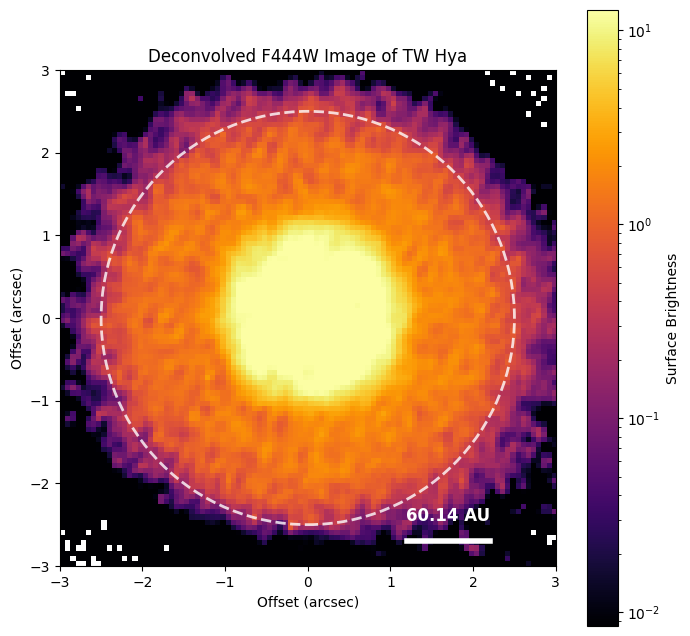

In [59]:
# --- Plot Original Image ---
plt.figure(figsize=(8, 8), dpi=100)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [-half_extent, half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = extent_arcsec / pixel_scale
half_extent_pix = extent_pixels / 2

# Create a cropped view centered on the image
x_start = int(center_x - half_extent_pix)
x_end = int(center_x + half_extent_pix)
y_start = int(center_y - half_extent_pix)
y_end = int(center_y + half_extent_pix)

# Ensure we don't go outside image bounds
x_start = max(0, x_start)
x_end = min(nx, x_end)
y_start = max(0, y_start)
y_end = min(ny, y_end)

cropped_image = image[y_start:y_end, x_start:x_end]

plt.imshow(cropped_image, origin='lower', cmap='inferno', 
           norm=LogNorm(vmin=clim_low_raw, vmax=clim_high_raw),
           extent=extent)

# Add reference circle at 5" radius (actually 2.5" radius since extent goes from -2.5 to +2.5)
circle = plt.Circle((0, 0), 2.5, fill=False, color='white', linewidth=2, linestyle='--', alpha=0.8)
plt.gca().add_patch(circle)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

plt.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
plt.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# Convert extent to AU for secondary labels
extent_au = np.array(extent) * dist  # Convert arcsec to AU

plt.colorbar(label='Surface Brightness')
plt.title(f'Deconvolved {filter_name} Image of TW Hya')

# Set primary axes labels in arcseconds
plt.xlabel('Offset (arcsec)')
plt.ylabel('Offset (arcsec)')

plt.savefig('original_image.png', dpi=300, bbox_inches='tight')
plt.show()

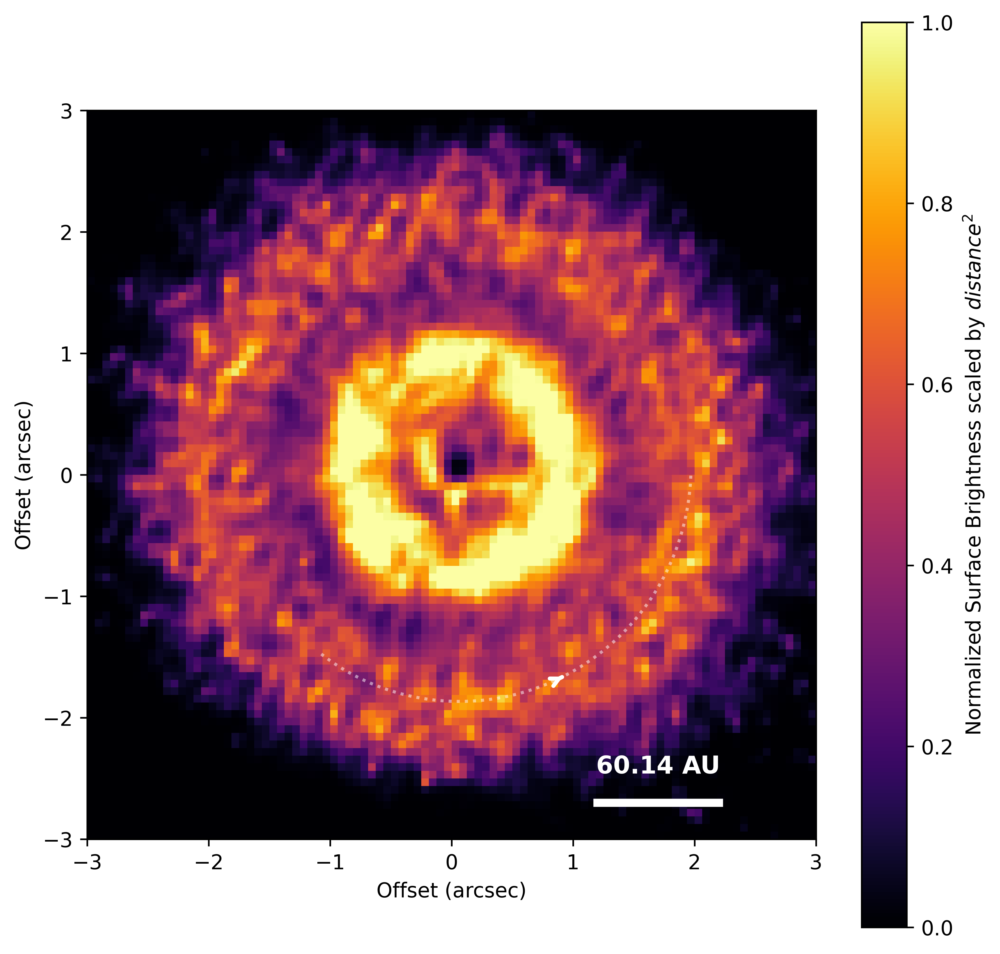

In [60]:
# --- Plot Original Image ---
plt.figure(figsize=(8, 8), dpi=600)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [-half_extent, half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = extent_arcsec / pixel_scale
half_extent_pix = extent_pixels / 2

# Create a cropped view centered on the image
x_start = int(center_x - half_extent_pix)
x_end = int(center_x + half_extent_pix)
y_start = int(center_y - half_extent_pix)
y_end = int(center_y + half_extent_pix)

# Ensure we don't go outside image bounds
x_start = max(0, x_start)
x_end = min(nx, x_end)
y_start = max(0, y_start)
y_end = min(ny, y_end)

cropped_image = image[y_start:y_end, x_start:x_end]

# distance of each pixel in arcseconds
distances = np.empty_like(cropped_image)
for i in range(cropped_image.shape[0]):
    for j in range(cropped_image.shape[1]):
        # Calculate distance from the center in arcseconds
        distances[i, j] = np.sqrt(((y_start + i) - center_y)**2 + ((x_start + j) - center_x)**2) * pixel_scale

# Normalize the image by maximum value and scale by distance^2
scaled_image = cropped_image * distances**2
normalized_image = scaled_image / np.nanpercentile(scaled_image, 97)
plt.imshow(normalized_image, origin='lower', cmap='inferno',
           vmax=1.0,
           extent=extent)

# Add reference circle at 5" radius (actually 2.5" radius since extent goes from -2.5 to +2.5)
#circle = plt.Circle((0, 0), 2.5, fill=False, color='white', linewidth=2, linestyle='--', alpha=0.8)
#plt.gca().add_patch(circle)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

plt.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
plt.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# Add log spiral with a slope of 2 degrees
theta = np.linspace(-0.7 * np.pi, 0, 100)
r_spiral = 1.97* np.exp(np.tan(np.radians(2)) * theta)
x_spiral = r_spiral * np.cos(theta)
y_spiral = r_spiral * np.sin(theta)
plt.plot(x_spiral, y_spiral, color='white', linestyle=':', label='Log Spiral', alpha=0.5)

# Add a arrow indicating the log spiral direction
arrow_start = (r_spiral[50] * np.cos(theta[50]), r_spiral[50] * np.sin(theta[50]))
arrow_end = (r_spiral[51] * np.cos(theta[51]), r_spiral[51] * np.sin(theta[51]))
plt.annotate('', xy=arrow_end, xytext=arrow_start,
            arrowprops=dict(facecolor='white', edgecolor='white', arrowstyle='->', lw=2))

# Convert extent to AU for secondary labels
extent_au = np.array(extent) * dist  # Convert arcsec to AU

plt.colorbar(label=r'Normalized Surface Brightness scaled by $distance^2$')
#plt.title(f'Deconvolved {filter_name} Image of TW Hya')

# Set primary axes labels in arcseconds
plt.xlabel('Offset (arcsec)')
plt.ylabel('Offset (arcsec)')

plt.savefig('original_image.png', dpi=300, bbox_inches='tight')
plt.show()

Radius 39 au: Max at 247.6 deg, Min at 342.7 deg
Radius 53 au: Max at 137.4 deg, Min at 342.7 deg
Radius 88 au: Max at 232.6 deg, Min at 162.5 deg
Radius 141 au: Max at 62.3 deg, Min at 132.4 deg


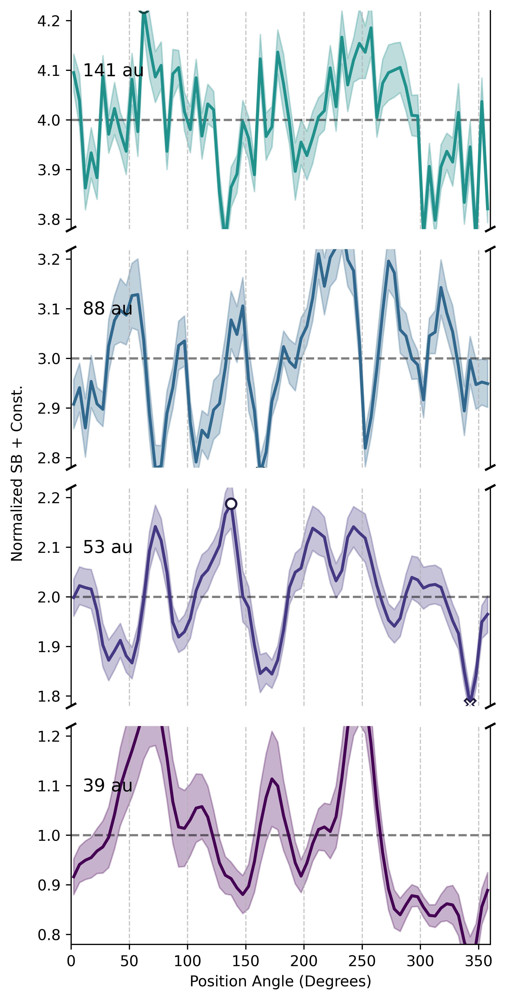

In [62]:
import numpy as np
import matplotlib.pyplot as plt

# Define the y-ranges you want to display
y_ranges = [(0.78, 1.22), (1.78, 2.22), (2.78, 3.22), (3.78, 4.22)]

# Create a figure with one column and a number of rows equal to your ranges
fig, axes = plt.subplots(len(y_ranges), 1, sharex=True, figsize=(5, 10), dpi=600)
fig.subplots_adjust(hspace=0)

# ==========================================
# BINNING PARAMETERS (in pixels)
# ==========================================
r_bin_size_pix = 10      # Number of pixels to bin in the radial direction
theta_bin_size_pix = 10  # Number of pixels to bin in the azimuthal (theta) direction

# Radii of interest in au
radii_au = np.array([39, 53, 88, 141])

# Convert au to pixels (assuming dist and pixel_scale are defined in your environment)
radii_pix_interest = (radii_au / dist) / pixel_scale

# Find the closest index in our radii_pix array
radii_indices = [np.argmin(np.abs(radii_pix - r)) for r in radii_pix_interest]

# Angles in degrees (assuming thetas is defined in your environment)
angles_deg = np.rad2deg(thetas)

# Create a list of colors for the plots
colors = plt.cm.viridis(np.linspace(0, 0.5, len(radii_au)))

# --- Plot each profile on its corresponding subplot ---
for i, ax in enumerate(axes[::-1]):
    radius_au = radii_au[i]
    radius_idx = radii_indices[i]
    
    # 1. Radial Binning: Extract the annulus slice
    start_idx = max(0, radius_idx - r_bin_size_pix // 2)
    end_idx = min(polar_image.shape[1], start_idx + r_bin_size_pix)
    annulus_data = polar_image[:, start_idx:end_idx]
    
    # 2. Theta Binning: Reshape the array into 2D bin chunks
    num_theta_bins = annulus_data.shape[0] // theta_bin_size_pix
    if num_theta_bins == 0: continue # Skip if bin size is larger than the image height
    
    # Truncate arrays to be exact multiples of theta_bin_size_pix
    annulus_data_trunc = annulus_data[:num_theta_bins * theta_bin_size_pix, :]
    angles_deg_trunc = angles_deg[:num_theta_bins * theta_bin_size_pix]
    
    # Reshape to (num_theta_bins, theta_bin_size_pix, r_pixels)
    binned_data = annulus_data_trunc.reshape(num_theta_bins, theta_bin_size_pix, annulus_data_trunc.shape[1])
    
    # Bin the angle array
    angles_binned = np.nanmean(angles_deg_trunc.reshape(num_theta_bins, theta_bin_size_pix), axis=1)
    
    # 3. Calculate metrics across both dimensions of the 2D bins (axis 1 for theta, axis 2 for r)
    profile = np.nanmean(binned_data, axis=(1, 2))
    std_dev = np.nanstd(binned_data, axis=(1, 2))
    
    # Count valid (non-NaN) pixels in each 2D bin to correctly calculate standard error
    pixel_count = np.sum(~np.isnan(binned_data), axis=(1, 2))
    
    # Protect against division by zero
    with np.errstate(divide='ignore', invalid='ignore'):
        yerr = np.where(pixel_count > 0, std_dev / np.sqrt(pixel_count), 0)
    
    profile_mean = np.nanmean(profile)
    if np.isnan(profile_mean) or profile_mean == 0: continue

    # Add offset to separate the plots
    offset = i
    
    normalized_profile = profile / profile_mean + offset
    normalized_yerr = yerr / profile_mean
    
    color = colors[i]
    
    # Set the y-limits for this specific subplot
    ax.set_ylim(y_ranges[i])

    # Add dashed line at the mean level
    ax.axhline(y=offset + 1, linestyle='--', color='black', alpha=0.5)
    
    upper_bound = normalized_profile + normalized_yerr
    lower_bound = normalized_profile - normalized_yerr
    
    # Use the binned angles for plotting
    ax.fill_between(angles_binned, lower_bound, upper_bound, alpha=0.3, color=color)
    ax.plot(angles_binned, normalized_profile, '-', color=color, linewidth=2)
    
    # Add text annotation for the radius
    ax.text(10, y_ranges[i][0] + 0.7 * (y_ranges[i][1] - y_ranges[i][0]), f'{radius_au} au', fontsize=12,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.0))
    
    # Mark the maximum and minimum points
    max_idx = np.nanargmax(normalized_profile)
    min_idx = np.nanargmin(normalized_profile)
    darker_color = np.copy(color)
    darker_color[:3] = darker_color[:3] * 0.5 
    
    ax.plot(angles_binned[max_idx], normalized_profile[max_idx], 'o', color='white', markersize=7, markeredgecolor=darker_color, markeredgewidth=1.5, zorder=5) 
    ax.plot(angles_binned[min_idx], normalized_profile[min_idx], 'x', color=darker_color, markersize=7, markeredgewidth=3)
    ax.plot(angles_binned[min_idx], normalized_profile[min_idx], 'x', color='white', markersize=5, markeredgewidth=1, zorder=5)
    print(f'Radius {radius_au} au: Max at {angles_binned[max_idx]:.1f} deg, Min at {angles_binned[min_idx]:.1f} deg')

    # --- Add break marks and clean up spines ---
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='x', which='both', bottom=False, top=False)
    
    d = .01 
    kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
    if i < len(axes)-1: 
        ax.plot((-d, +d), (1 - d, 1 + d), **kwargs)
        ax.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)
    if i > 0: 
        ax.plot((-d, +d), (-d, +d), **kwargs)
        ax.plot((1 - d, 1 + d), (-d, +d), **kwargs)
    ax.grid(axis='x', linestyle='--', alpha=0.7)

# --- Final plot adjustments ---
axes[-1].spines['bottom'].set_visible(True)
axes[-1].tick_params(axis='x', which='both', bottom=True)
axes[-1].set_xlim(0, 360)
axes[-1].set_xlabel('Position Angle (Degrees)')

fig.text(0.06, 0.5, 'Normalized SB + Const.', va='center', rotation='vertical')

plt.tight_layout(rect=[0.08, 0, 1, 0.95])
plt.savefig('azimuthal_distribution_broken_axis_binned.png', dpi=300, bbox_inches='tight')
plt.show()

# F356W

### HPFRDI Image

Data loaded and polar transformation complete.


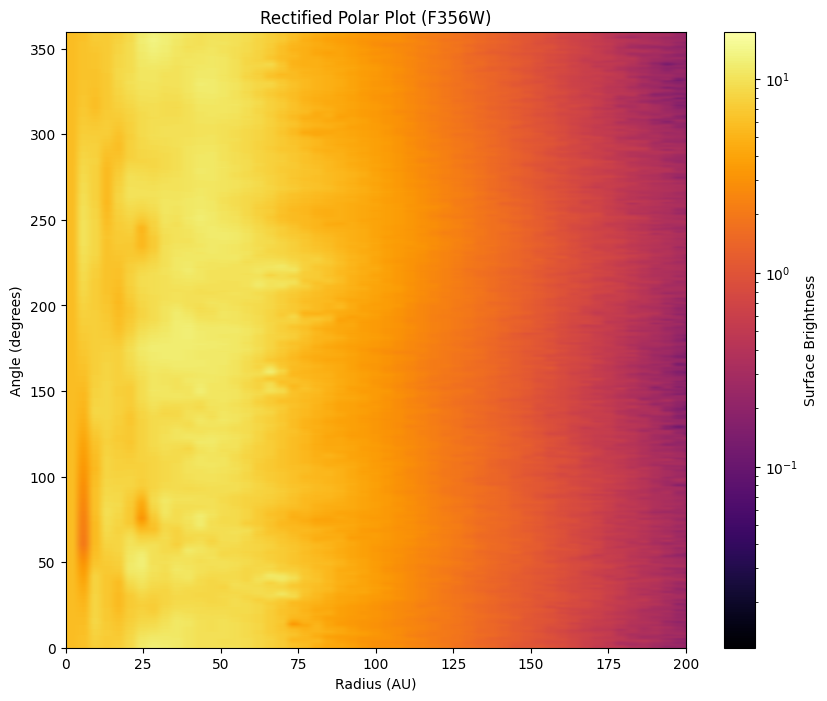

In [36]:
# Rectified Polar Plot
# Read fits file at source/F200W.fits
# Plot the data in a rectified polar plot

import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from matplotlib.colors import LogNorm
from scipy.ndimage import map_coordinates

# Load the FITS file
fits_file = 'source/F356W.fits'
hdul = fits.open(fits_file)
data = hdul[0].data
image = data[:,:,1]

# Read header
header = hdul[0].header
# print(header) # You can uncomment this to see the header details
pixel_scale = header['PIXSCALE'] # in arcsec/pixel
dist = 60.14 # distance to TW Hya in pc

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(image, 99.975)

# --- Polar transform ---

# Image dimensions and center
ny, nx = image.shape
center_y, center_x = (ny - 1) / 2.0, (nx - 1) / 2.0

# Define the polar grid
# The radius is the distance from the center to the corner.
max_radius_pix = np.sqrt(center_y**2 + center_x**2)
nr = int(max_radius_pix)
ntheta = 720 # number of angular points

radii_pix = np.linspace(0, max_radius_pix, nr)
thetas = np.linspace(0, 2 * np.pi, ntheta)

# Create a grid of polar coordinates
r_grid, theta_grid = np.meshgrid(radii_pix, thetas)

# Convert polar to Cartesian coordinates
x_cart = r_grid * np.cos(theta_grid + np.pi/2) + center_x
y_cart = r_grid * np.sin(theta_grid + np.pi/2) + center_y

# The coordinates for map_coordinates should be in a (2, N) array
coords = np.array([y_cart.ravel(), x_cart.ravel()])

# Perform the transformation
polar_image = map_coordinates(image, coords, order=1, mode='constant', cval=np.nan).reshape((ntheta, nr))
print("Data loaded and polar transformation complete.")

# plot the image
plt.figure(figsize=(10, 8), dpi=100)
plt.imshow(polar_image, origin='lower', cmap='inferno', 
           norm=LogNorm(vmin=clim_low_raw, vmax=clim_high_raw),
           aspect='auto', extent=[0, max_radius_pix*pixel_scale*dist, 0, 360])

# Set x limit to 0 to 200 AU
plt.xlim(0, 200)
plt.colorbar(label='Surface Brightness')
filter_name = fits_file.split('/')[-1].split('.')[0]
plt.title(f'Rectified Polar Plot ({filter_name})')
plt.ylabel('Angle (degrees)')
plt.xlabel('Radius (AU)')
plt.savefig('rectified_polar.png')
plt.show()

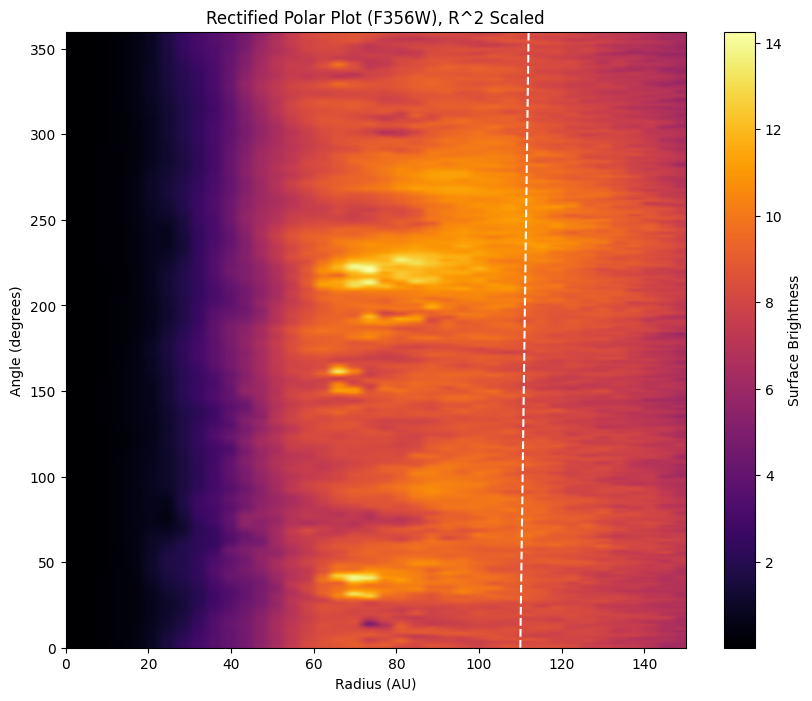

In [37]:
# Apply R^2 scaling to enhance outer features
radii_arcsec = radii_pix * pixel_scale
polar_image_r2_scaled = np.zeros_like(polar_image)
for i in range(polar_image.shape[1]):
    if radii_arcsec[i] > 0:
        polar_image_r2_scaled[:, i] = polar_image[:, i] * (radii_arcsec[i]**2)

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(polar_image_r2_scaled, 97)

# plot the image
plt.figure(figsize=(10, 8), dpi=100)
plt.imshow(polar_image_r2_scaled, origin='lower', cmap='inferno', 
           vmin=clim_low_raw, vmax=clim_high_raw,
           aspect='auto', extent=[0, max_radius_pix*pixel_scale*dist, 0, 360])

# add a sloped line at 110 AU with slope 2 degrees to the vertical axis
x = np.array([110, 112])
y = np.array([0, 360])
plt.plot(x, y, color='white', linestyle='--', label='Slope = 2 degrees')

# Set x limit to 0 to 200 AU
plt.xlim(0, 150)
plt.colorbar(label='Surface Brightness')
filter_name = fits_file.split('/')[-1].split('.')[0]
plt.title(f'Rectified Polar Plot ({filter_name}), R^2 Scaled')
plt.ylabel('Angle (degrees)')
plt.xlabel('Radius (AU)')
plt.savefig('rectified_polar.png')
plt.show()

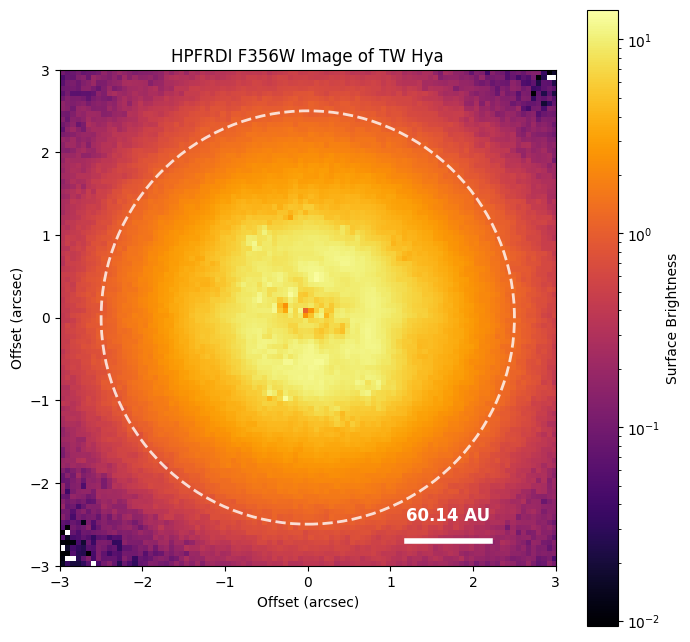

In [38]:
# --- Plot Original Image ---
plt.figure(figsize=(8, 8), dpi=100)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [-half_extent, half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = extent_arcsec / pixel_scale
half_extent_pix = extent_pixels / 2

# Create a cropped view centered on the image
x_start = int(center_x - half_extent_pix)
x_end = int(center_x + half_extent_pix)
y_start = int(center_y - half_extent_pix)
y_end = int(center_y + half_extent_pix)

# Ensure we don't go outside image bounds
x_start = max(0, x_start)
x_end = min(nx, x_end)
y_start = max(0, y_start)
y_end = min(ny, y_end)

cropped_image = image[y_start:y_end, x_start:x_end]

plt.imshow(cropped_image, origin='lower', cmap='inferno', 
           norm=LogNorm(vmin=clim_low_raw, vmax=clim_high_raw),
           extent=extent)

# Add reference circle at 5" radius (actually 2.5" radius since extent goes from -2.5 to +2.5)
circle = plt.Circle((0, 0), 2.5, fill=False, color='white', linewidth=2, linestyle='--', alpha=0.8)
plt.gca().add_patch(circle)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

plt.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
plt.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# Convert extent to AU for secondary labels
extent_au = np.array(extent) * dist  # Convert arcsec to AU

plt.colorbar(label='Surface Brightness')
plt.title(f'HPFRDI {filter_name} Image of TW Hya')

# Set primary axes labels in arcseconds
plt.xlabel('Offset (arcsec)')
plt.ylabel('Offset (arcsec)')

plt.savefig('original_image.png', dpi=300, bbox_inches='tight')
plt.show()


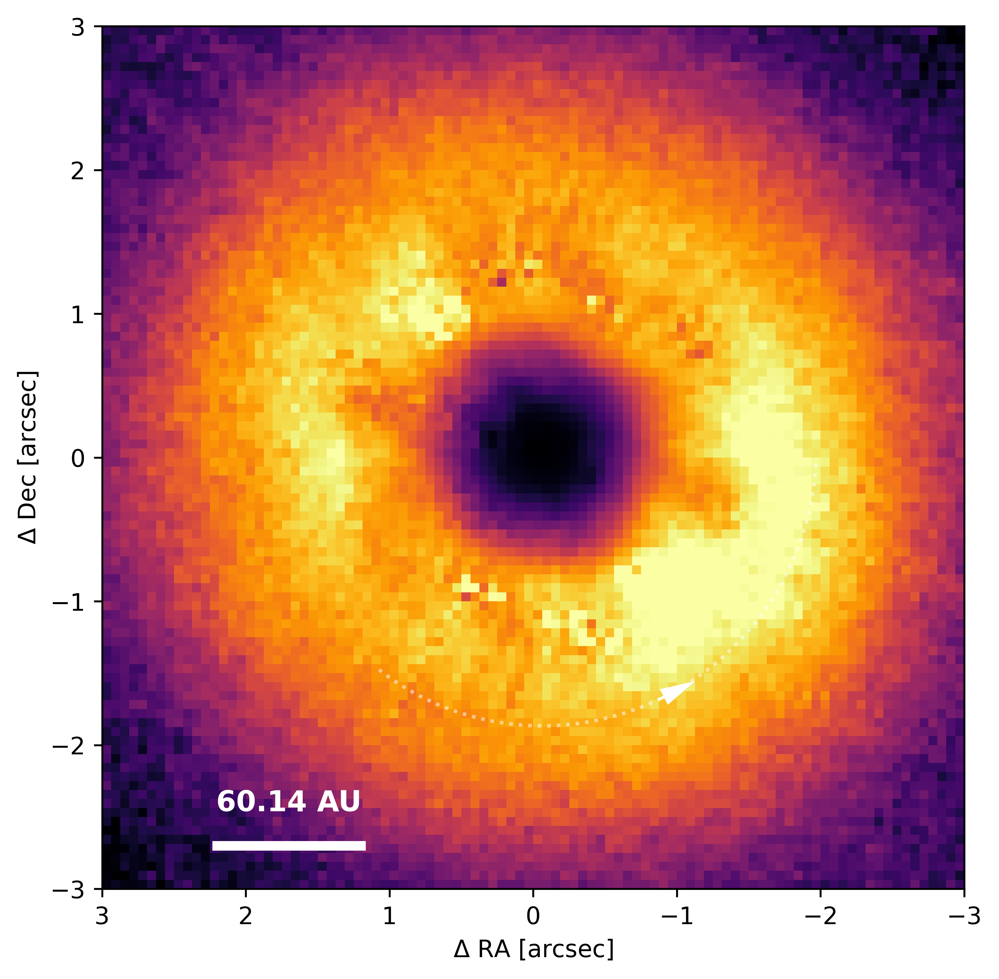

In [39]:
# --- Plot Original Image ---
plt.figure(figsize=(6.5, 6.5), dpi=600)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [half_extent, -half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = extent_arcsec / pixel_scale
half_extent_pix = extent_pixels / 2

# Create a cropped view centered on the image
x_start = int(center_x - half_extent_pix)
x_end = int(center_x + half_extent_pix)
y_start = int(center_y - half_extent_pix)
y_end = int(center_y + half_extent_pix)

# Ensure we don't go outside image bounds
x_start = max(0, x_start)
x_end = min(nx, x_end)
y_start = max(0, y_start)
y_end = min(ny, y_end)

cropped_image = image[y_start:y_end, x_start:x_end]

# distance of each pixel in arcseconds
distances = np.empty_like(cropped_image)
for i in range(cropped_image.shape[0]):
    for j in range(cropped_image.shape[1]):
        # Calculate distance from the center in arcseconds
        distances[i, j] = np.sqrt(((y_start + i) - center_y)**2 + ((x_start + j) - center_x)**2) * pixel_scale

# Normalize the image by maximum value and scale by distance^2
scaled_image = cropped_image * distances**2
normalized_image = scaled_image / np.nanpercentile(scaled_image, 97)
plt.imshow(normalized_image, origin='lower', cmap='inferno',
           vmax=1.0, vmin=0.0,
           extent=extent)

# Add reference circle at 5" radius (actually 2.5" radius since extent goes from -2.5 to +2.5)
#circle = plt.Circle((0, 0), 2.5, fill=False, color='white', linewidth=2, linestyle='--', alpha=0.8)
#plt.gca().add_patch(circle)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

plt.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
plt.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# Add log spiral with a slope of 2 degrees
theta = np.linspace(-0.7 * np.pi, 0, 100)
r_spiral = 1.97* np.exp(np.tan(np.radians(2)) * theta)
x_spiral = r_spiral * np.cos(theta)
y_spiral = r_spiral * np.sin(theta)
plt.plot(-x_spiral, y_spiral, color='white', linestyle=':', label='Log Spiral', alpha=0.5)

# Add a arrow indicating the log spiral direction
plt.arrow( -r_spiral[50]*np.cos(theta[50]), r_spiral[50]*np.sin(theta[50]),
           -0.5*(r_spiral[51]-r_spiral[50])*np.cos(theta[50])-r_spiral[50]*(-np.sin(theta[50])*(theta[51]-theta[50])),
           0.5*(r_spiral[51]-r_spiral[50])*np.sin(theta[50])+r_spiral[50]*(np.cos(theta[50])*(theta[51]-theta[50])),
           head_width=0.1, head_length=0.2, fc='white', ec='white')
           
# Add vertical (to the spiral) lines at the start and end of the spiral
'''
plt.plot([r_spiral[0]*np.cos(theta[0]) - 0.1/2**0.5, r_spiral[0]*np.cos(theta[0]) + 0.1/2**0.5],
         [r_spiral[0]*np.sin(theta[0]) - 0.1/2**0.5, r_spiral[0]*np.sin(theta[0]) + 0.1/2**0.5],
         color='white', linestyle='-', alpha=1)
plt.plot([r_spiral[-1]*np.cos(theta[-1]) + 0.1, r_spiral[-1]*np.cos(theta[-1]) - 0.1],
         [r_spiral[-1]*np.sin(theta[-1]), r_spiral[-1]*np.sin(theta[-1])],
         color='white', linestyle='-')
'''
# Convert extent to AU for secondary labels
extent_au = np.array(extent) * dist  # Convert arcsec to AU

#plt.colorbar(label=r'Normalized Surface Brightness scaled by $distance^2$')
#plt.title(f'Deconvolved {filter_name} Image of TW Hya')

# Set primary axes labels in arcseconds
plt.xlabel(r'$\Delta$ RA [arcsec]')
plt.ylabel(r'$\Delta$ Dec [arcsec]')

plt.savefig('original_image.png', dpi=600, bbox_inches='tight')
plt.show()

total pixels in annulus: 192
Radius 39 au: Max at 193.4 deg, Min at 59.9 deg (Bin Width: 84.38 deg, Resolution: 1.88 deg)
total pixels in annulus: 272
Radius 53 au: Max at 166.4 deg, Min at 60.9 deg (Bin Width: 59.56 deg, Resolution: 1.32 deg)
total pixels in annulus: 456
Radius 88 au: Max at 225.0 deg, Min at 6.1 deg (Bin Width: 35.53 deg, Resolution: 0.79 deg)
total pixels in annulus: 724
Radius 141 au: Max at 242.4 deg, Min at 349.9 deg (Bin Width: 22.38 deg, Resolution: 0.50 deg)


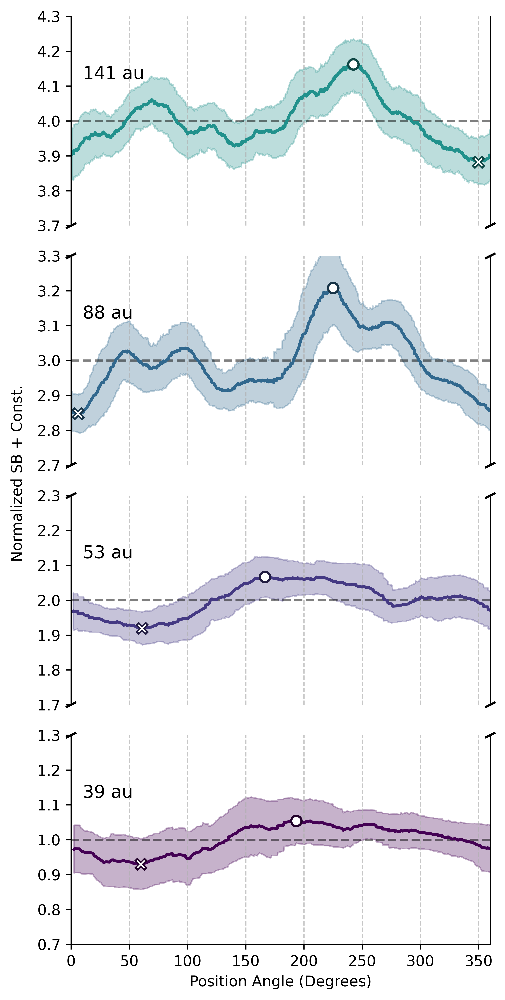

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from numpy.lib.stride_tricks import sliding_window_view

# Load the FITS file
fits_file = 'source/F356W.fits'
hdul = fits.open(fits_file)
data = hdul[0].data
image = data[:, :, 1]

# Read header
header = hdul[0].header
pixel_scale = header['PIXSCALE'] 
dist = 60.14 

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(image, 99.975)

# --- Configurations & Inputs ---
y_ranges = [(0.7, 1.3), (1.7, 2.3), (2.7, 3.3), (3.7, 4.3)]
radii_au = np.array([39, 53, 88, 141])

r_bin_size_pix = 3
theta_bin_size_pix = 15
beam_size_pix = 27.752524248265935 # beam size in pixels used for error calculation

# --- Cartesian Coordinate Grid Setup ---

# Image dimensions and center
ny, nx = image.shape
center_y, center_x = (ny - 1) / 2.0, (nx - 1) / 2.0

# Generate 2D grids of pixel indices
y_indices, x_indices = np.indices(image.shape)
dy = y_indices - center_y
dx = x_indices - center_x

# Calculate the physical radius (in pixels) for every pixel
r_grid = np.sqrt(dx**2 + dy**2)

# Calculate position angle
theta_grid_rad = np.arctan2(-dx, dy)
theta_grid_deg = np.rad2deg(theta_grid_rad) % 360.0

# --- Setup Figure ---
fig, axes = plt.subplots(len(y_ranges), 1, sharex=True, figsize=(5, 10), dpi=600)
fig.subplots_adjust(hspace=0)
colors = plt.cm.viridis(np.linspace(0, 0.5, len(radii_au)))

# Pre-calculate padding widths for 1D sliding window
pad_before = theta_bin_size_pix*r_bin_size_pix // 2
pad_after = theta_bin_size_pix*r_bin_size_pix - pad_before - 1

# --- Direct Pixel-by-Pixel Binning ---
for i, ax in enumerate(axes[::-1]):
    radius_au = radii_au[i]
    radius_pix = (radius_au / dist) / pixel_scale
    offset = i
    
    # 1. Extract and Sort Pixels in Radial Annulus
    radial_mask = np.abs(r_grid - radius_pix) <= (r_bin_size_pix / 2.0)
    annulus_vals = image[radial_mask]
    annulus_angles = theta_grid_deg[radial_mask]
    print("total pixels in annulus:", len(annulus_vals))
    
    # Sort the unordered Cartesian pixels by position angle to form a 1D ring
    sort_idx = np.argsort(annulus_angles)
    sorted_angles = annulus_angles[sort_idx]
    sorted_vals = annulus_vals[sort_idx]
    
    # 2. Wrap Boundaries for Sliding Window
    padded_vals = np.pad(sorted_vals, (pad_before, pad_after), mode='wrap')
    
    # 3. Vectorized Sliding Window
    # Moves a theta_bin_size_pix * r_bin_size_pix window along the sorted 1D array, 1 pixel at a time
    windows = sliding_window_view(padded_vals, theta_bin_size_pix*r_bin_size_pix)
    profile = np.nanmean(windows, axis=1)
    std_dev = np.nanstd(windows, axis=1)
    pixel_count = np.sum(~np.isnan(windows), axis=1)
    
    # 4. Error and Normalization
    with np.errstate(divide='ignore', invalid='ignore'):
        yerr = np.where(pixel_count > 0, std_dev / np.sqrt(pixel_count / beam_size_pix), 0)
        
    profile_mean = np.nanmean(profile)
    normalized_profile = profile / profile_mean + offset
    normalized_yerr = yerr / profile_mean
    
    # 5. Snap Curve Exactly to 360 Degrees for Plotting
    angles_binned = np.append(sorted_angles, sorted_angles[0] + 360.0)
    normalized_profile = np.append(normalized_profile, normalized_profile[0])
    normalized_yerr = np.append(normalized_yerr, normalized_yerr[0])
    
    # 6. Plotting
    ax.set_ylim(y_ranges[i])
    ax.axhline(y=offset + 1, linestyle='--', color='black', alpha=0.5)
    
    upper_bound = normalized_profile + normalized_yerr
    lower_bound = normalized_profile - normalized_yerr
    color = colors[i]
    
    ax.fill_between(angles_binned, lower_bound, upper_bound, alpha=0.3, color=color)
    ax.plot(angles_binned, normalized_profile, '-', color=color, linewidth=2)
    ax.text(10, y_ranges[i][0] + 0.7 * (y_ranges[i][1] - y_ranges[i][0]), f'{radius_au} au', fontsize=12)
    
    # 7. Markers and Info
    max_idx = np.nanargmax(normalized_profile[:-1])
    min_idx = np.nanargmin(normalized_profile[:-1])
    
    # Calculate dynamic physical bin width (average angular span of the 15 pixels)
    mean_d_theta_deg = (theta_bin_size_pix*r_bin_size_pix / len(sorted_angles)) * 360.0
    resolution_deg = 360.0 / len(sorted_angles)
    
    print(f'Radius {radius_au} au: Max at {angles_binned[max_idx]:.1f} deg, '
          f'Min at {angles_binned[min_idx]:.1f} deg '
          f'(Bin Width: {mean_d_theta_deg:.2f} deg, Resolution: {resolution_deg:.2f} deg)')
    
    darker_color = color * [0.5, 0.5, 0.5, 1.0] 
    
    ax.plot(angles_binned[max_idx], normalized_profile[max_idx], 'o', color='white', markersize=7, markeredgecolor=darker_color, markeredgewidth=1.5, zorder=5) 
    ax.plot(angles_binned[min_idx], normalized_profile[min_idx], 'x', color=darker_color, markersize=7, markeredgewidth=3)
    ax.plot(angles_binned[min_idx], normalized_profile[min_idx], 'x', color='white', markersize=5, markeredgewidth=1, zorder=5)
    
    # 8. Axes Aesthetics
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='x', which='both', bottom=False, top=False)
    
    d = .01 
    kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
    if i < len(axes) - 1: 
        ax.plot((-d, +d), (1 - d, 1 + d), **kwargs)
        ax.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)
    if i > 0: 
        ax.plot((-d, +d), (-d, +d), **kwargs)
        ax.plot((1 - d, 1 + d), (-d, +d), **kwargs)
    ax.grid(axis='x', linestyle='--', alpha=0.7)

# --- Final Layout Adjustment & Output ---
axes[-1].spines['bottom'].set_visible(True)
axes[-1].tick_params(axis='x', which='both', bottom=True)
axes[-1].set_xlim(0, 360)
axes[-1].set_xlabel('Position Angle (Degrees)')

fig.text(0.06, 0.5, 'Normalized SB + Const.', va='center', rotation='vertical')
plt.tight_layout(rect=[0.08, 0, 1, 0.95])
plt.savefig('azimuthal_shadow_f356w.png', dpi=300, bbox_inches='tight')
plt.show()

### Deconvolved Image

Data loaded and polar transformation complete.


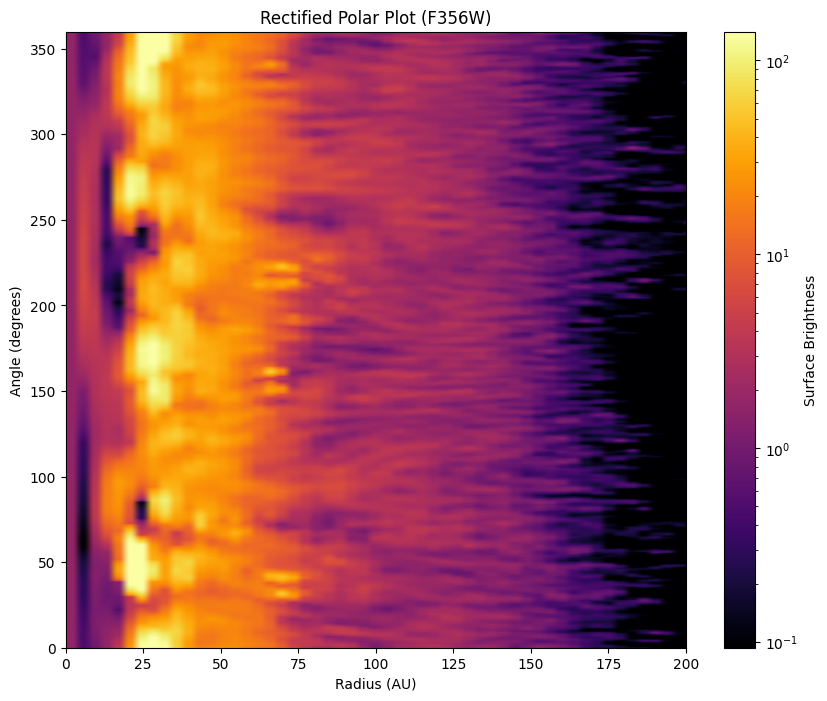

In [43]:
# Rectified Polar Plot
# Read fits file at source/F200W.fits
# Plot the data in a rectified polar plot

import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from matplotlib.colors import LogNorm
from scipy.ndimage import map_coordinates

# Load the FITS file
fits_file = 'source/F356W.fits'
hdul = fits.open(fits_file)
data = hdul[0].data
image = data[:,:,0]

# Read header
header = hdul[0].header
# print(header) # You can uncomment this to see the header details
pixel_scale = header['PIXSCALE'] # in arcsec/pixel
dist = 60.14 # distance to TW Hya in pc

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(image, 99.975)

# --- Polar transform ---

# Image dimensions and center
ny, nx = image.shape
center_y, center_x = (ny - 1) / 2.0, (nx - 1) / 2.0

# Define the polar grid
# The radius is the distance from the center to the corner.
max_radius_pix = np.sqrt(center_y**2 + center_x**2)
nr = int(max_radius_pix)
ntheta = 720 # number of angular points

radii_pix = np.linspace(0, max_radius_pix, nr)
thetas = np.linspace(0, 2 * np.pi, ntheta)

# Create a grid of polar coordinates
r_grid, theta_grid = np.meshgrid(radii_pix, thetas)

# Convert polar to Cartesian coordinates
x_cart = r_grid * np.cos(theta_grid + np.pi/2) + center_x
y_cart = r_grid * np.sin(theta_grid + np.pi/2) + center_y

# The coordinates for map_coordinates should be in a (2, N) array
coords = np.array([y_cart.ravel(), x_cart.ravel()])

# Perform the transformation
polar_image = map_coordinates(image, coords, order=1, mode='constant', cval=np.nan).reshape((ntheta, nr))
print("Data loaded and polar transformation complete.")

# plot the image
plt.figure(figsize=(10, 8), dpi=100)
plt.imshow(polar_image, origin='lower', cmap='inferno', 
           norm=LogNorm(vmin=clim_low_raw, vmax=clim_high_raw),
           aspect='auto', extent=[0, max_radius_pix*pixel_scale*dist, 0, 360])

# Set x limit to 0 to 200 AU
plt.xlim(0, 200)
plt.colorbar(label='Surface Brightness')
filter_name = fits_file.split('/')[-1].split('.')[0]
plt.title(f'Rectified Polar Plot ({filter_name})')
plt.ylabel('Angle (degrees)')
plt.xlabel('Radius (AU)')
plt.savefig('rectified_polar.png')
plt.show()

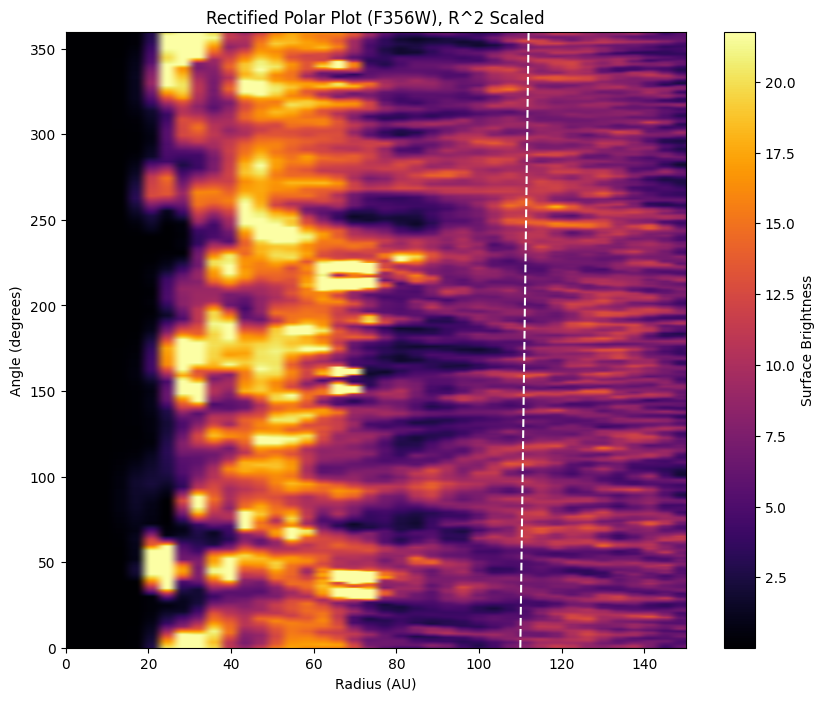

In [44]:
# Apply R^2 scaling to enhance outer features
radii_arcsec = radii_pix * pixel_scale
polar_image_r2_scaled = np.zeros_like(polar_image)
for i in range(polar_image.shape[1]):
    if radii_arcsec[i] > 0:
        polar_image_r2_scaled[:, i] = polar_image[:, i] * (radii_arcsec[i]**2)

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(polar_image_r2_scaled, 97)

# plot the image
plt.figure(figsize=(10, 8), dpi=100)
plt.imshow(polar_image_r2_scaled, origin='lower', cmap='inferno', 
           vmin=clim_low_raw, vmax=clim_high_raw,
           aspect='auto', extent=[0, max_radius_pix*pixel_scale*dist, 0, 360])

# add a sloped line at 110 AU with slope 2 degrees to the vertical axis
x = np.array([110, 112])
y = np.array([0, 360])
plt.plot(x, y, color='white', linestyle='--', label='Slope = 2 degrees')

# Set x limit to 0 to 200 AU
plt.xlim(0, 150)
plt.colorbar(label='Surface Brightness')
filter_name = fits_file.split('/')[-1].split('.')[0]
plt.title(f'Rectified Polar Plot ({filter_name}), R^2 Scaled')
plt.ylabel('Angle (degrees)')
plt.xlabel('Radius (AU)')
plt.savefig('rectified_polar.png')
plt.show()

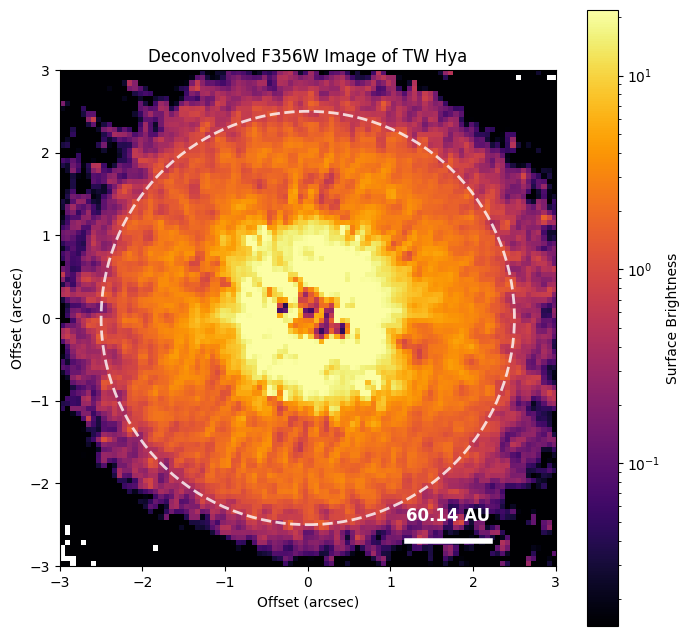

In [45]:
# --- Plot Original Image ---
plt.figure(figsize=(8, 8), dpi=100)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [-half_extent, half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = extent_arcsec / pixel_scale
half_extent_pix = extent_pixels / 2

# Create a cropped view centered on the image
x_start = int(center_x - half_extent_pix)
x_end = int(center_x + half_extent_pix)
y_start = int(center_y - half_extent_pix)
y_end = int(center_y + half_extent_pix)

# Ensure we don't go outside image bounds
x_start = max(0, x_start)
x_end = min(nx, x_end)
y_start = max(0, y_start)
y_end = min(ny, y_end)

cropped_image = image[y_start:y_end, x_start:x_end]

plt.imshow(cropped_image, origin='lower', cmap='inferno', 
           norm=LogNorm(vmin=clim_low_raw, vmax=clim_high_raw),
           extent=extent)

# Add reference circle at 5" radius (actually 2.5" radius since extent goes from -2.5 to +2.5)
circle = plt.Circle((0, 0), 2.5, fill=False, color='white', linewidth=2, linestyle='--', alpha=0.8)
plt.gca().add_patch(circle)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

plt.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
plt.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# Convert extent to AU for secondary labels
extent_au = np.array(extent) * dist  # Convert arcsec to AU

plt.colorbar(label='Surface Brightness')
plt.title(f'Deconvolved {filter_name} Image of TW Hya')

# Set primary axes labels in arcseconds
plt.xlabel('Offset (arcsec)')
plt.ylabel('Offset (arcsec)')

plt.savefig('original_image.png', dpi=300, bbox_inches='tight')
plt.show()


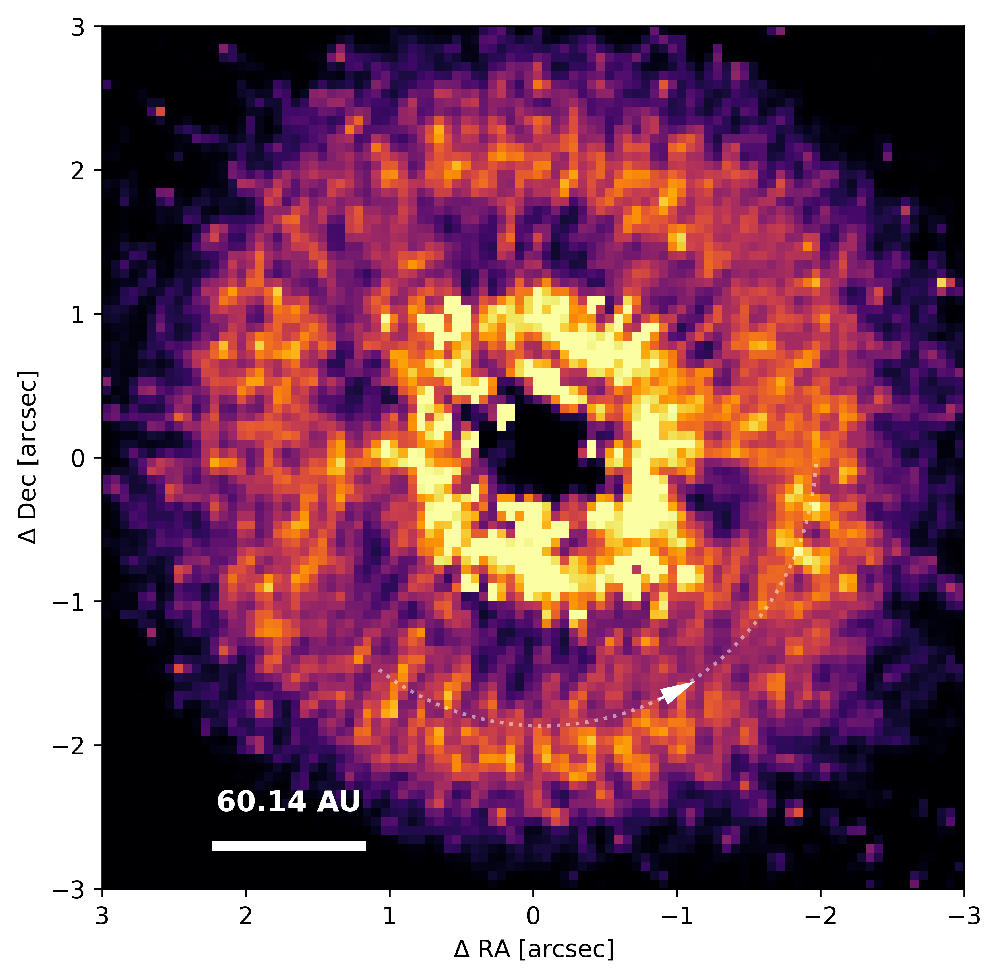

In [46]:
# --- Plot Original Image ---
plt.figure(figsize=(6.5, 6.5), dpi=600)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [half_extent, -half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = extent_arcsec / pixel_scale
half_extent_pix = extent_pixels / 2

# Create a cropped view centered on the image
x_start = int(center_x - half_extent_pix)
x_end = int(center_x + half_extent_pix)
y_start = int(center_y - half_extent_pix)
y_end = int(center_y + half_extent_pix)

# Ensure we don't go outside image bounds
x_start = max(0, x_start)
x_end = min(nx, x_end)
y_start = max(0, y_start)
y_end = min(ny, y_end)

cropped_image = image[y_start:y_end, x_start:x_end]

# distance of each pixel in arcseconds
distances = np.empty_like(cropped_image)
for i in range(cropped_image.shape[0]):
    for j in range(cropped_image.shape[1]):
        # Calculate distance from the center in arcseconds
        distances[i, j] = np.sqrt(((y_start + i) - center_y)**2 + ((x_start + j) - center_x)**2) * pixel_scale

# Normalize the image by maximum value and scale by distance^2
scaled_image = cropped_image * distances**2
normalized_image = scaled_image / np.nanpercentile(scaled_image, 97)
plt.imshow(normalized_image, origin='lower', cmap='inferno',
           vmax=1.0, vmin=0.0,
           extent=extent)

# Add reference circle at 5" radius (actually 2.5" radius since extent goes from -2.5 to +2.5)
#circle = plt.Circle((0, 0), 2.5, fill=False, color='white', linewidth=2, linestyle='--', alpha=0.8)
#plt.gca().add_patch(circle)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

plt.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
plt.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# Add log spiral with a slope of 2 degrees
theta = np.linspace(-0.7 * np.pi, 0, 100)
r_spiral = 1.97* np.exp(np.tan(np.radians(2)) * theta)
x_spiral = r_spiral * np.cos(theta)
y_spiral = r_spiral * np.sin(theta)
plt.plot(-x_spiral, y_spiral, color='white', linestyle=':', label='Log Spiral', alpha=0.5)

# Add a arrow indicating the log spiral direction
plt.arrow( -r_spiral[50]*np.cos(theta[50]), r_spiral[50]*np.sin(theta[50]),
           -0.5*(r_spiral[51]-r_spiral[50])*np.cos(theta[50])-r_spiral[50]*(-np.sin(theta[50])*(theta[51]-theta[50])),
           0.5*(r_spiral[51]-r_spiral[50])*np.sin(theta[50])+r_spiral[50]*(np.cos(theta[50])*(theta[51]-theta[50])),
           head_width=0.1, head_length=0.2, fc='white', ec='white')
           
# Add vertical (to the spiral) lines at the start and end of the spiral
'''
plt.plot([r_spiral[0]*np.cos(theta[0]) - 0.1/2**0.5, r_spiral[0]*np.cos(theta[0]) + 0.1/2**0.5],
         [r_spiral[0]*np.sin(theta[0]) - 0.1/2**0.5, r_spiral[0]*np.sin(theta[0]) + 0.1/2**0.5],
         color='white', linestyle='-', alpha=1)
plt.plot([r_spiral[-1]*np.cos(theta[-1]) + 0.1, r_spiral[-1]*np.cos(theta[-1]) - 0.1],
         [r_spiral[-1]*np.sin(theta[-1]), r_spiral[-1]*np.sin(theta[-1])],
         color='white', linestyle='-')
'''
# Convert extent to AU for secondary labels
extent_au = np.array(extent) * dist  # Convert arcsec to AU

#plt.colorbar(label=r'Normalized Surface Brightness scaled by $distance^2$')
#plt.title(f'Deconvolved {filter_name} Image of TW Hya')

# Set primary axes labels in arcseconds
plt.xlabel(r'$\Delta$ RA [arcsec]')
plt.ylabel(r'$\Delta$ Dec [arcsec]')

plt.savefig('original_image.png', dpi=600, bbox_inches='tight')
plt.show()

# Other Filters

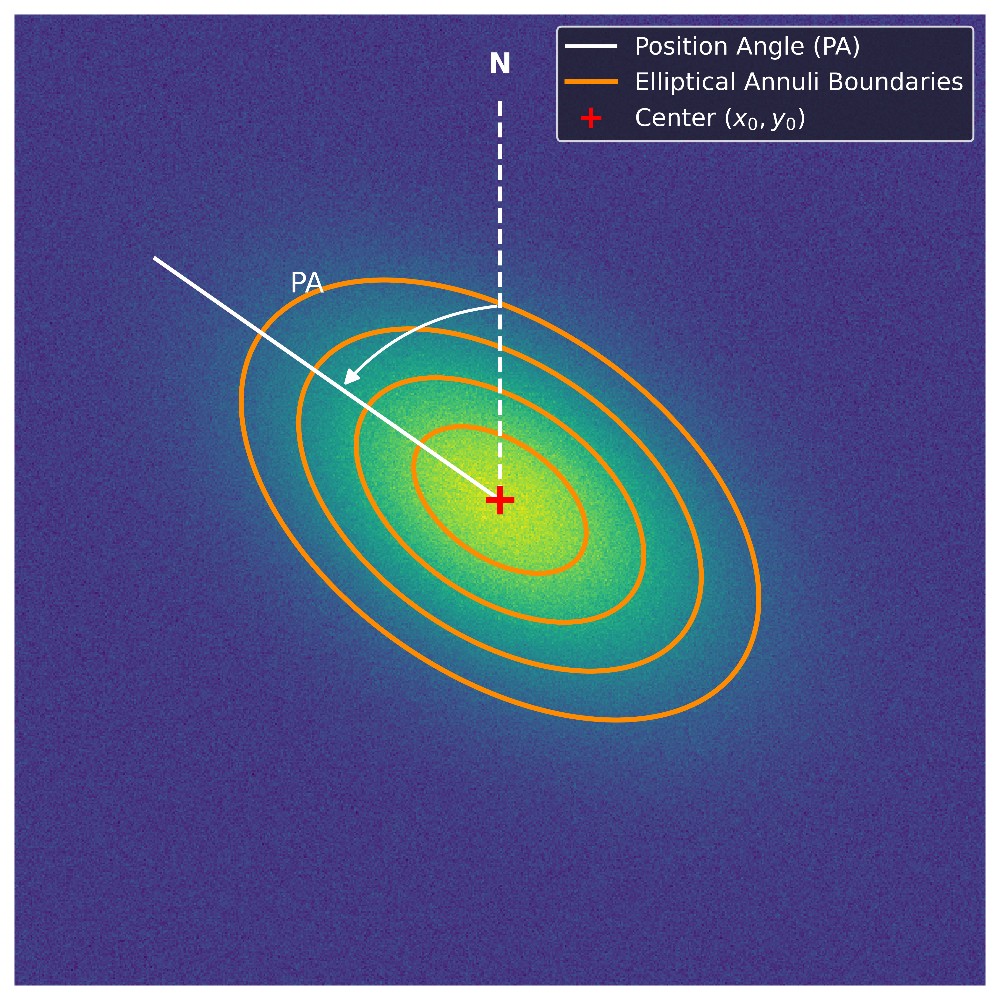

In [48]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse, FancyArrowPatch
from matplotlib.lines import Line2D
import matplotlib.patheffects as pe

def generate_figure():
    # 1. Setup Data and Dimensions
    N = 600
    x = np.linspace(-3, 3, N)
    y = np.linspace(-3, 3, N)
    X, Y = np.meshgrid(x, y)

    # Parameters for the rotated Gaussian
    # Angle of major axis from Vertical (North)
    angle_from_north_deg = 55 
    # Matplotlib angle is counter-clockwise from X-axis (East)
    # North is 90 deg. We rotate left (CCW) by 55 deg.
    mpl_angle = 90 + angle_from_north_deg 
    theta = np.radians(mpl_angle)

    # Rotated coordinates for the Gaussian calculation
    xr = X * np.cos(theta) + Y * np.sin(theta)
    yr = -X * np.sin(theta) + Y * np.cos(theta)

    # 2D Gaussian with noise
    sigma_x, sigma_y = 1.0, 0.6  # Elongation
    amp = 1.0
    Z = amp * np.exp(-(xr**2/(2*sigma_x**2) + yr**2/(2*sigma_y**2)))
    
    # Add noise to simulate the texture in the original image
    noise = np.random.normal(0, 0.05, Z.shape)
    Z_noisy = Z + noise

    # 2. plotting
    fig, ax = plt.subplots(figsize=(7, 7), dpi=600)
    
    # Background Image
    ax.imshow(Z_noisy, cmap='viridis', origin='lower', extent=[-3, 3, -3, 3])

    # 3. Geometry Elements
    center = (0, 0)
    
    # A. Elliptical Annuli Boundaries (Orange)
    # Draw 4 concentric ellipses
    radii = [1.2, 2.0, 2.8, 3.6] # Arbitrary scaling to match look
    for r in radii:
        # Width/Height correspond to major/minor axes * 2 (diameter)
        # In our rotated coords, sigma_x was the major. 
        # So width relates to sigma_x, height to sigma_y
        # Aspect ratio is sigma_y/sigma_x = 0.6
        ell = Ellipse(xy=center, width=r, height=r*0.6, angle=mpl_angle,
                      edgecolor='darkorange', facecolor='none', lw=2.5)
        ax.add_patch(ell)

    # B. North Direction (Dashed Line)
    # Length of line
    line_len = 2.5
    ax.plot([0, 0], [0, line_len], color='white', linestyle='--', linewidth=2)
    
    # ** modification **: Add "N" on top instead of legend
    ax.text(0, line_len + 0.1, "N", color='white', fontsize=14, 
            ha='center', va='bottom', fontweight='bold')

    # C. Position Angle (PA) Line (Solid White)
    # Calculate end point based on angle
    pa_len = 2.6
    pa_end_x = pa_len * np.cos(theta)
    pa_end_y = pa_len * np.sin(theta)
    ax.plot([0, pa_end_x], [0, pa_end_y], color='white', linewidth=2)

    # D. Arc Arrow (Angle Indicator)
    # Arc from North (90 deg) to PA angle (mpl_angle)
    # Using FancyArrowPatch for a nice curved arrow
    # To curve "left" from vertical to top-left, we calculate start/end points on a small circle
    arc_rad = 1.2
    # Start point (North)
    p1 = (0, arc_rad)
    # End point (PA line)
    p2 = (arc_rad * np.cos(theta), arc_rad * np.sin(theta))
    
    arrow = FancyArrowPatch(posA=p1, posB=p2, 
                            connectionstyle=f"arc3,rad={0.2}", # Rad determines curvature
                            arrowstyle='-|>', color='white', 
                            mutation_scale=15, lw=1.5)
    ax.add_patch(arrow)

    # E. Text "PA"
    # Position it slightly offset from the arc
    text_angle = np.radians(90 + angle_from_north_deg/2)
    text_rad = arc_rad + 0.3
    tx = text_rad * np.cos(text_angle)
    ty = text_rad * np.sin(text_angle)
    ax.text(tx-0.5, ty, "PA", color='white', fontsize=14, ha='center', va='center')

    # F. Center Marker (Red Cross)
    ax.scatter([0], [0], color='red', marker='+', s=200, linewidths=3, zorder=10)

    # 4. Legend
    # We need to manually create legend handles to match the style
    
    # Define custom handles
    legend_elements = [
        Line2D([0], [0], color='white', lw=2, label='Position Angle (PA)'),
        Line2D([0], [0], color='darkorange', lw=2.5, label='Elliptical Annuli Boundaries'), # Using Line2D to mimic the patch outline
        Line2D([0], [0], color='red', marker='+', linestyle='None', markersize=10, markeredgewidth=2, label=r'Center ($x_0, y_0$)'),
        # REMOVED: North Direction
    ]

    # Create the legend
    leg = ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=12)
    
    # Style the legend background (dark semi-transparent)
    leg.get_frame().set_facecolor('#202030') # Dark blue/grey
    leg.get_frame().set_edgecolor('white')
    leg.get_frame().set_alpha(0.8)
    
    # Set text color in legend to white
    for text in leg.get_texts():
        text.set_color("white")

    # 5. Final Adjustments
    ax.set_xlim(-3, 3)
    ax.set_ylim(-3, 3)
    ax.axis('off') # Remove axis ticks and labels
    
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    generate_figure()